In [9]:
# Ignore Warnings
import warnings
warnings.filterwarnings('ignore')

In [1]:
# Load libraries
import math
import statistics
import numpy as np
import pylab as py
import pandas as pd
import seaborn as sns
import scipy.stats as stats
import statsmodels.api as sm
from scipy.stats import chi2
from ipywidgets import interact
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from itertools import combinations
from scipy.spatial.distance import mahalanobis
from pandas.plotting import parallel_coordinates

from sklearn.svm import SVC
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from statsmodels.multivariate.manova import MANOVA
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import mutual_info_classif
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier, IsolationForest
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score

In [2]:
# Load the dataset
data_1 = pd.read_csv("Agri Project Data With Outlier.csv")

In [110]:
# Display the first few rows
data_1.head()

,Nitrogen,Phosphorus,Potassium,Temperature,Humidity,pH,Rainfall,Crop
0,90.0,42.0,43.0,20.88,82.00,6.50,202.94,rice
1,85.0,58.0,41.0,21.77,80.32,7.04,226.66,rice
2,60.0,55.0,44.0,23.00,82.32,7.84,263.96,rice
3,74.0,35.0,40.0,26.49,80.16,6.98,242.86,rice
4,78.0,42.0,42.0,20.13,81.60,7.63,262.72,rice


In [111]:
# Dropping the Categorical feature
data = data_1.drop('Crop', axis=1)

In [6]:
# Display the first few rows
data.head()

,Nitrogen,Phosphorus,Potassium,Temperature,Humidity,pH,Rainfall
0,90.0,42.0,43.0,20.88,82.00,6.50,202.94
1,85.0,58.0,41.0,21.77,80.32,7.04,226.66
2,60.0,55.0,44.0,23.00,82.32,7.84,263.96
3,74.0,35.0,40.0,26.49,80.16,6.98,242.86
4,78.0,42.0,42.0,20.13,81.60,7.63,262.72


In [7]:
# Getting the column names
data_1.columns

Index(['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH',
       'Rainfall', 'Crop'],
      dtype='object')

In [8]:
# Get summary information
data_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2200 entries, 0 to 2199
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Nitrogen     2200 non-null   float64
 1   Phosphorus   2200 non-null   float64
 2   Potassium    2200 non-null   float64
 3   Temperature  2200 non-null   float64
 4   Humidity     2200 non-null   float64
 5   pH           2200 non-null   float64
 6   Rainfall     2200 non-null   float64
 7   Crop         2200 non-null   object 
dtypes: float64(7), object(1)
memory usage: 137.6+ KB


In [9]:
# Getting shape of the data
data_1.shape

(2200, 8)

In [10]:
# Checking for null values
data_1.isnull().sum()

Nitrogen       0
Phosphorus     0
Potassium      0
Temperature    0
Humidity       0
pH             0
Rainfall       0
Crop           0
dtype: int64

In [11]:
# Checking for duplicate values
data_1.duplicated().sum()

np.int64(0)

In [12]:
# Getting the total count of crop types in the data
data_1["Crop"].describe()

count     2200
unique      22
top       rice
freq       100
Name: Crop, dtype: object

In [13]:
# Getting the count of each types of crops in the data
data_1['Crop'].value_counts()

Crop
rice           100
maize          100
chickpea       100
kidneybeans    100
pigeonpeas     100
mothbeans      100
mungbean       100
blackgram      100
lentil         100
pomegranate    100
banana         100
mango          100
grapes         100
watermelon     100
muskmelon      100
apple          100
orange         100
papaya         100
coconut        100
cotton         100
jute           100
coffee         100
Name: count, dtype: int64

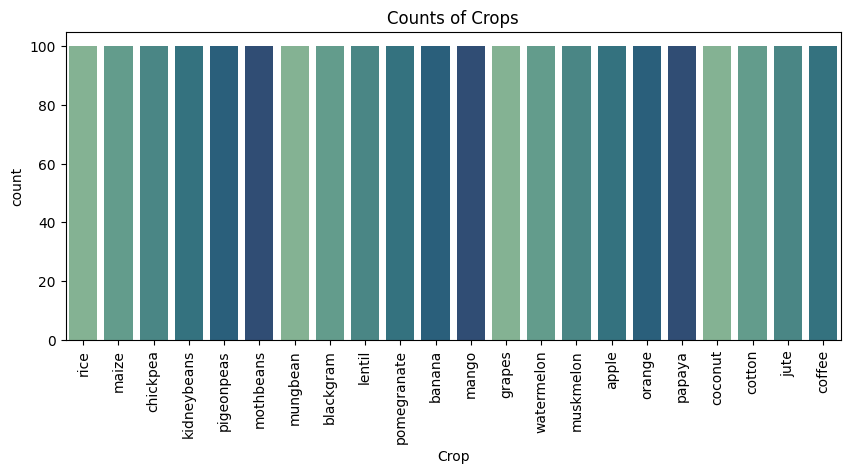

In [14]:
# Count of crops present in dataset - Count Plot
plt.figure(figsize=(10, 4))
cmap = sns.color_palette("crest")
sns.countplot(x ="Crop", data = data_1, palette = cmap)
plt.xticks(rotation = 90)
plt.title("Counts of Crops")
plt.show()

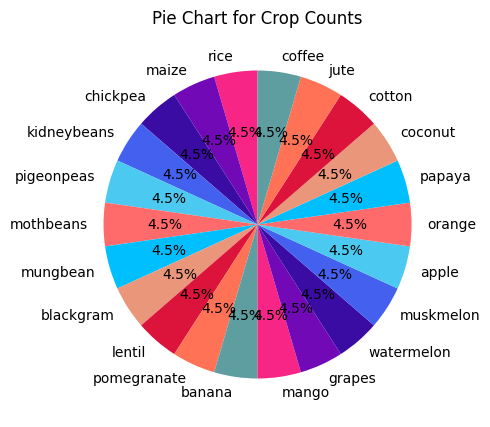

In [15]:
# Count of crops in data set using Pie Chart
counts = data_1['Crop'].value_counts()
plt.figure(figsize=(5, 5))
color = ["#F72585", "#7209B7", "#3A0CA3", "#4361EE", "#4CC9F0", "#FF6A6A", 
         "#00BFFF", "#E9967A", "#DC143C", "#FF7256", "#5F9EA0"]
counts.plot(kind='pie', autopct='%1.1f%%', startangle=90, colors = color)
plt.title('Pie Chart for Crop Counts')
plt.ylabel('')
plt.show()

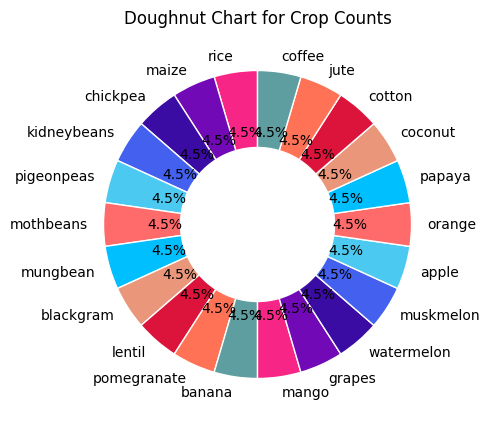

In [16]:
# Count of crops in data set - Doughnut chart
counts = data_1['Crop'].value_counts()
fig, ax = plt.subplots(figsize=(5, 5))
color = ["#F72585", "#7209B7", "#3A0CA3", "#4361EE", "#4CC9F0", 
         "#FF6A6A", "#00BFFF", "#E9967A", "#DC143C", "#FF7256", "#5F9EA0"]
ax.pie(counts.values, labels=counts.index, autopct='%1.1f%%', 
       startangle=90, colors = color,
       wedgeprops={'width': 0.5, 'edgecolor': 'w'})
circle = plt.Circle((0, 0), 0.4, color='white')
fig.gca().add_artist(circle)
ax.set_title('Doughnut Chart for Crop Counts')
plt.show()

In [17]:
# Statistics summary of the data
data_1.describe()

,Nitrogen,Phosphorus,Potassium,Temperature,Humidity,pH,Rainfall
count,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000
mean,50.551818,53.362727,48.149091,25.616136,71.481877,6.469445,103.463691
std,36.917334,32.985883,50.647931,5.063700,22.263811,0.773905,54.958311
min,0.000000,5.000000,5.000000,8.830000,14.260000,3.500000,20.210000
25%,21.000000,28.000000,20.000000,22.770000,60.262500,5.970000,64.552500
50%,37.000000,51.000000,32.000000,25.600000,80.470000,6.425000,94.865000
75%,84.250000,68.000000,49.000000,28.560000,89.950000,6.920000,124.270000
max,140.000000,145.000000,205.000000,43.680000,99.980000,9.940000,298.560000


In [18]:
# Skewness:
data.skew()

Nitrogen       0.509721
Phosphorus     1.010773
Potassium      2.375167
Temperature    0.184958
Humidity      -1.091705
pH             0.283805
Rainfall       0.965756
dtype: float64

In [19]:
# Kurtosis
data.kurtosis()

Nitrogen      -1.058240
Phosphorus     0.860279
Potassium      4.449354
Temperature    1.232472
Humidity       0.302127
pH             1.658025
Rainfall       0.607078
dtype: float64

In [20]:
# Normality Testing (Shapiro-Wilk):
features = data.columns
normality_results = {}
for col in features:
    stat, p = stats.shapiro(data[col])
    normality_results[col] = {'Shapiro-Stat': stat, 'p-value': p, 'Is_Normal': p > 0.05}
normality_df = pd.DataFrame(normality_results).transpose()
normality_df

,Shapiro-Stat,p-value,Is_Normal
Nitrogen,0.915396,0.0,False
Phosphorus,0.911167,0.0,False
Potassium,0.605532,0.0,False
Temperature,0.982099,0.0,False
Humidity,0.866365,0.0,False
pH,0.979084,0.0,False
Rainfall,0.93027,0.0,False


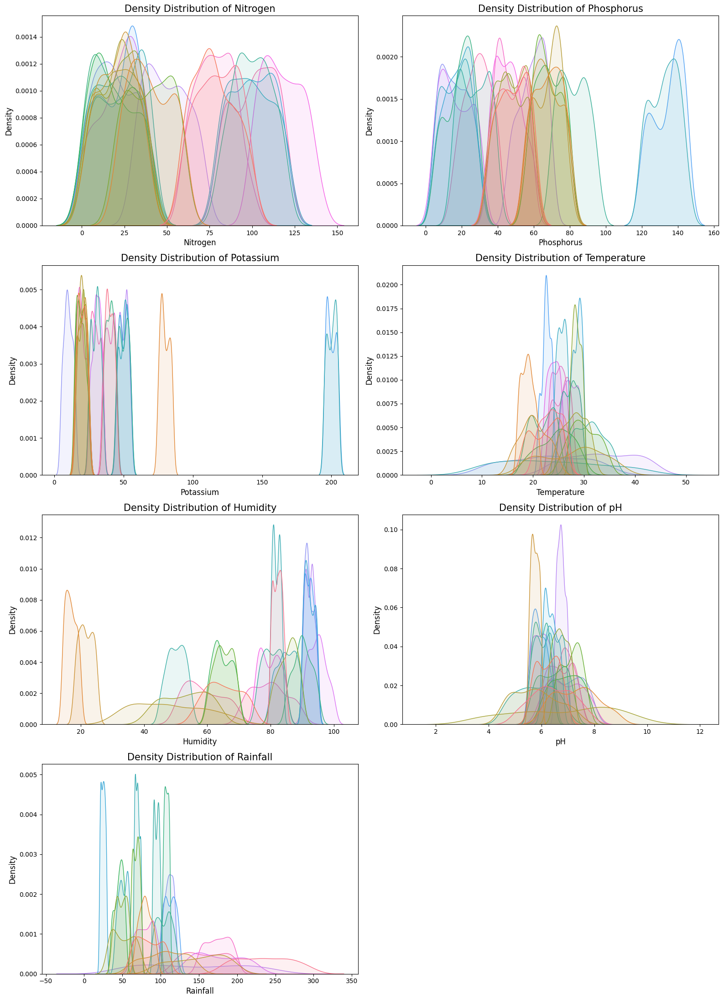

In [21]:
# KDE Plots - Density PLot
features = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
label_col = 'Crop'
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(16, 22))
axes = axes.flatten()
for i, feature in enumerate(features):
    sns.kdeplot(data=data_1, x=feature, hue=label_col, fill=True, 
                ax=axes[i], palette='husl', alpha=0.1, legend=False)
    axes[i].set_title(f'Density Distribution of {feature}', fontsize=15)
    axes[i].set_xlabel(feature, fontsize=12)
    axes[i].set_ylabel('Density', fontsize=12)
fig.delaxes(axes[7])
plt.tight_layout()
plt.show()

In [22]:
# One-Way ANOVA
features = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
crops = data_1['Crop'].unique()
anova_list = []
for feature in features:
    grouped_data = [data_1[data_1['Crop'] == c][feature] for c in crops]
    f_stat, p_val = stats.f_oneway(*grouped_data)
    anova_list.append({
        'Feature': feature,
        'F-statistic': round(f_stat, 2),
        'p-value': f"{p_val:.4e}",
        'Significant': p_val < 0.05})
df_anova = pd.DataFrame(anova_list)
print(df_anova)

       Feature  F-statistic      p-value  Significant
0     Nitrogen       897.57   0.0000e+00         True
1   Phosphorus      1885.66   0.0000e+00         True
2    Potassium     27238.36   0.0000e+00         True
3  Temperature       102.19  3.9545e-305         True
4     Humidity      3103.89   0.0000e+00         True
5           pH        60.34  6.5054e-199         True
6     Rainfall       605.52   0.0000e+00         True


In [23]:
# Independent T-test
features = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
crops = sorted(data_1['Crop'].unique())
crop_pairs = list(combinations(crops, 2))
all_ttest_results = []
for feature in features:
    for crop1, crop2 in crop_pairs:
        data_c1 = data_1[data_1['Crop'] == crop1][feature]
        data_c2 = data_1[data_1['Crop'] == crop2][feature]
        t_stat, p_val = stats.ttest_ind(data_c1, data_c2)
        
        all_ttest_results.append({
            'Feature': feature,
            'Crop_1': crop1,
            'Crop_2': crop2,
            't-statistic': t_stat,
            'p-value': p_val,
            'Significant (0.05)': p_val < 0.05})

df_all_ttests = pd.DataFrame(all_ttest_results)
df_all_ttests.to_csv('all_crops_all_features_ttest.csv', index=False)
df_all_ttests

,Feature,Crop_1,Crop_2,t-statistic,p-value,Significant (0.05)
0,Nitrogen,apple,banana,-48.874838,1.893814e-112,True
1,Nitrogen,apple,blackgram,-11.075816,1.689903e-22,True
2,Nitrogen,apple,chickpea,-11.359137,2.384626e-23,True
3,Nitrogen,apple,coconut,-0.706333,4.808114e-01,False
4,Nitrogen,apple,coffee,-46.958042,2.790840e-109,True
...,...,...,...,...,...,...
1612,Rainfall,pigeonpeas,rice,-18.226234,3.191334e-44,True
1613,Rainfall,pigeonpeas,watermelon,29.450341,2.795350e-74,True
1614,Rainfall,pomegranate,rice,-37.383970,1.155960e-91,True
1615,Rainfall,pomegranate,watermelon,86.724915,1.814598e-159,True


In [24]:
# Post-Hoc Analysis (Tukey HSD)
features = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
tukey_summary = []
for feature in features:
    tukey = pairwise_tukeyhsd(endog=data_1[feature], groups=data_1[crop_col := 'Crop'], alpha=0.05)
    tukey_df = pd.DataFrame(data=tukey._results_table.data[1:], columns=tukey._results_table.data[0])
    tukey_df.to_csv(f'tukey_results_{feature.lower()}.csv', index=False)
    total_pairs = len(tukey_df)
    sig_pairs = tukey_df[tukey_df['reject'] == True].shape[0]
    tukey_summary.append({
        'Feature': feature,
        'Total Comparisons': total_pairs,
        'Significant Differences': sig_pairs,
        'Percentage Significant': round((sig_pairs / total_pairs) * 100, 2)})
df_summary = pd.DataFrame(tukey_summary)
df_summary

,Feature,Total Comparisons,Significant Differences,Percentage Significant
0,Nitrogen,231,166,71.86
1,Phosphorus,231,194,83.98
2,Potassium,231,190,82.25
3,Temperature,231,172,74.46
4,Humidity,231,213,92.21
5,pH,231,155,67.10
6,Rainfall,231,205,88.74


In [25]:
# MANOVA: Multivariate Analysis of Variance
# Independent variable: label. Dependent variables: N, P, K, temperature, humidity, ph, rainfall.
maov = MANOVA.from_formula('Nitrogen + Phosphorus + Potassium + Temperature + Humidity + pH + Rainfall ~ Crop', data=data_1)
manova_results = maov.mv_test()
print(manova_results)

                      Multivariate linear model
                                                                      
----------------------------------------------------------------------
          Intercept         Value   Num DF   Den DF   F Value   Pr > F
----------------------------------------------------------------------
             Wilks' lambda   0.0042 7.0000 2172.0000 73927.1174 0.0000
            Pillai's trace   0.9958 7.0000 2172.0000 73927.1174 0.0000
    Hotelling-Lawley trace 238.2550 7.0000 2172.0000 73927.1174 0.0000
       Roy's greatest root 238.2550 7.0000 2172.0000 73927.1174 0.0000
----------------------------------------------------------------------
                                                                      
----------------------------------------------------------------------
          Crop           Value    Num DF    Den DF    F Value   Pr > F
----------------------------------------------------------------------
          Wilks' lambda   0.0

In [26]:
# Outlier Detection (Z-Score)
features = data.columns
z_scores = np.abs(stats.zscore(data[features]))
outliers_count = (z_scores > 3).sum(axis=0)
outlier_df_z = pd.DataFrame({'Feature_Name': features, 'Outlier_Count': outliers_count})
print(outlier_df_z.to_string(index=False))

Feature_Name  Outlier_Count
    Nitrogen              0
  Phosphorus              0
   Potassium             94
 Temperature             33
    Humidity              0
          pH             30
    Rainfall             22


In [27]:
# Global Outlier Detection (IQR Method)
numeric_data = data_1.select_dtypes(include=['number'])
Q1 = numeric_data.quantile(0.25)
Q3 = numeric_data.quantile(0.75)
IQR = Q3 - Q1
lower, upper = Q1 - 1.5 * IQR, Q3 + 1.5 * IQR

outlier_df_IQR = pd.DataFrame({
    'Lower Bound': lower,
    'Upper Bound': upper,
    'Outlier Count': ((numeric_data < lower) | (numeric_data > upper)).sum(),
    'Percentage (%)': ((numeric_data < lower) | (numeric_data > upper)).mean().mul(100).round(2)})
outlier_df_IQR

,Lower Bound,Upper Bound,Outlier Count,Percentage (%)
Nitrogen,-73.87500,179.12500,0,0.00
Phosphorus,-32.00000,128.00000,138,6.27
Potassium,-23.50000,92.50000,200,9.09
Temperature,14.08500,37.24500,86,3.91
Humidity,15.73125,134.48125,30,1.36
pH,4.54500,8.34500,57,2.59
Rainfall,-25.02375,213.84625,100,4.55


In [28]:
# Comparison Summary: (IQR Method - Z-Score)
comparison = outlier_df_z.set_index('Feature_Name')
comparison['IQR_Count'] = outlier_df_IQR['Outlier Count']
comparison.columns = ['Z-Score Outliers', 'IQR Outliers']
comparison

,Z-Score Outliers,IQR Outliers
Feature_Name,,
Nitrogen,0,0
Phosphorus,0,138
Potassium,94,200
Temperature,33,86
Humidity,0,30
pH,30,57
Rainfall,22,100


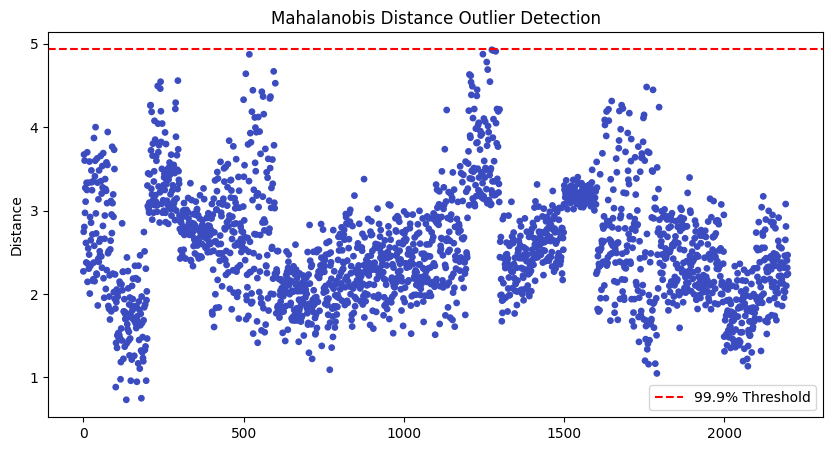

In [29]:
# Outlier Detection (Mahalanobis Distance)
df_results = data_1.copy()  # Create a duplicate
data = data_1.drop(columns='Crop')
X = data.values

## Mahalanobis Distance Calculation
diff = X - X.mean(axis=0)
inv_cov = np.linalg.inv(np.cov(X.T))

## Vectorized calculation for Mahalanobis Distance squared
df_results['MD_sq'] = np.sum(np.dot(diff, inv_cov) * diff, axis=1)
df_results['Mahalanobis_Distance'] = np.sqrt(np.sum(np.dot(diff, inv_cov) * diff, axis=1))

##Thresholding
thresh = chi2.ppf(0.999, df=X.shape[1])
df_results['Is_Outlier'] = df_results['MD_sq'] > thresh

## Visualization
plt.figure(figsize=(10, 5))
plt.scatter(df_results.index, np.sqrt(df_results['MD_sq']), c=df_results['Is_Outlier'], cmap='coolwarm', s=15)
plt.axhline(np.sqrt(thresh), color='red', ls='--', label='99.9% Threshold')
plt.title('Mahalanobis Distance Outlier Detection')
plt.ylabel('Distance')
plt.legend(); plt.show()

# 5. Save results
df_results.to_csv('Agri_Simple_Results.csv', index=False)

In [30]:
# Get the top 10 most unusual rows
top_10_outliers = df_results.nlargest(10, 'MD_sq')
print(top_10_outliers[['Crop', 'MD_sq']])

           Crop      MD_sq
1275     grapes  24.287501
1279     grapes  24.200298
1287     grapes  24.105479
1247     grapes  23.770121
518   mothbeans  23.750931
1259     grapes  22.855287
1262     grapes  22.004160
594   mothbeans  21.803470
507   mothbeans  21.534748
1205     grapes  21.453992


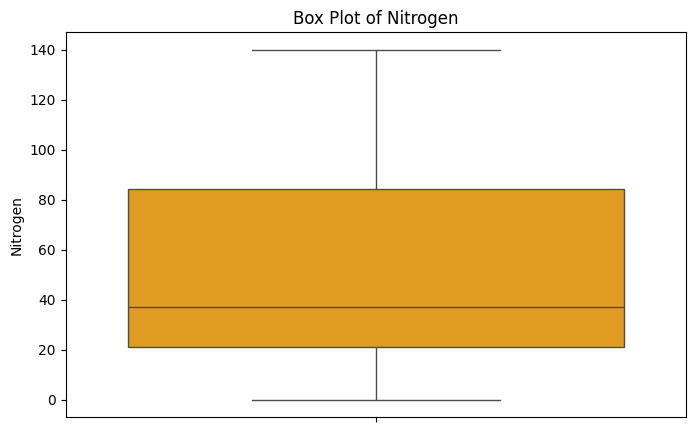

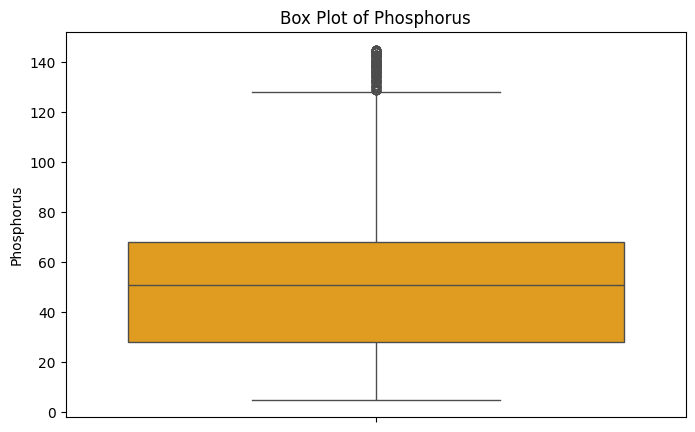

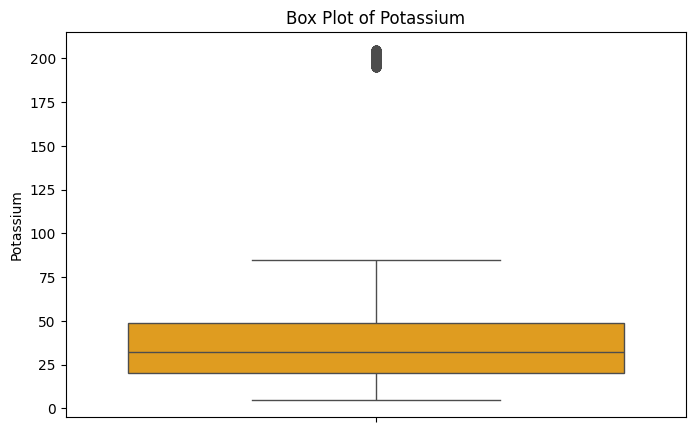

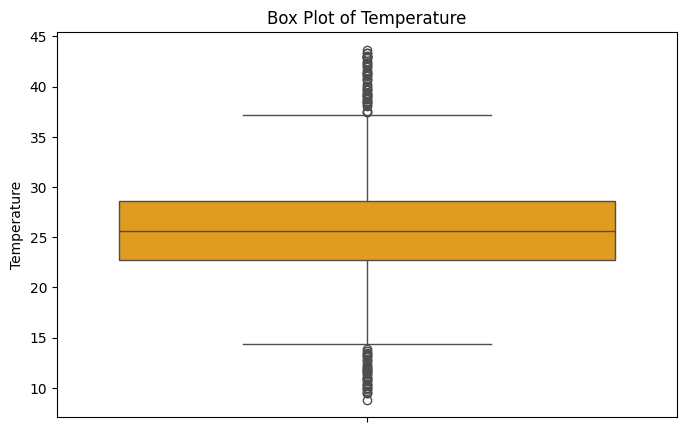

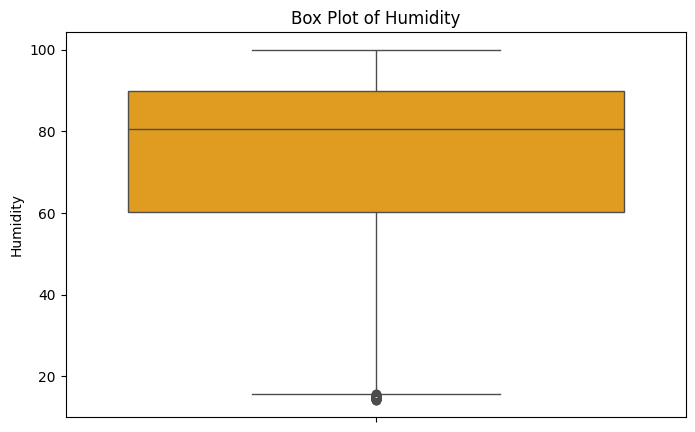

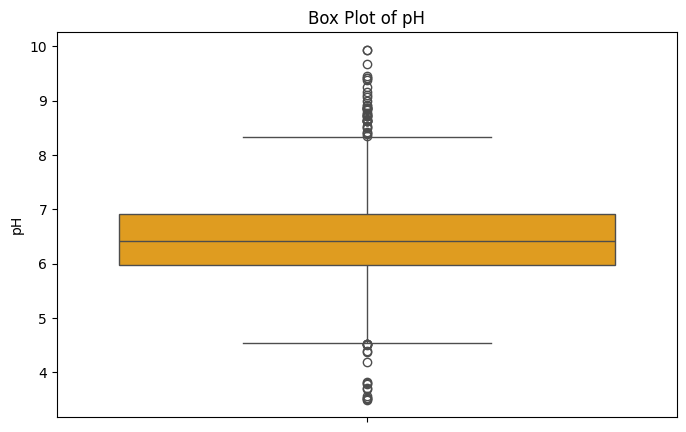

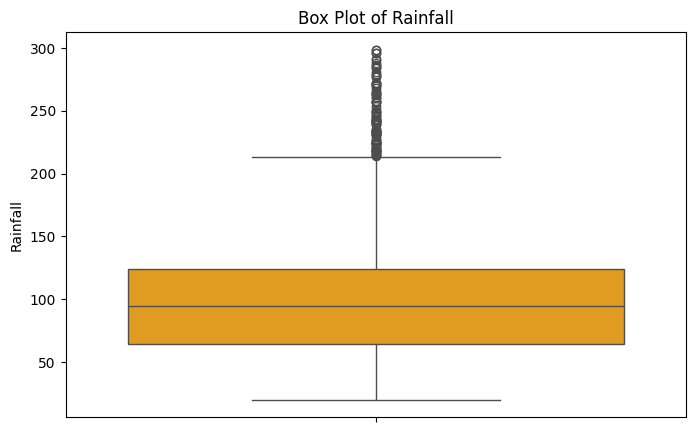

In [31]:
# Box Plots
features = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
for feature in features:
    plt.figure(figsize=(8, 5))
    sns.boxplot(y=data_1[feature], color='orange')
    plt.title(f"Box Plot of {feature}")
    plt.ylabel(feature)
    plt.show()

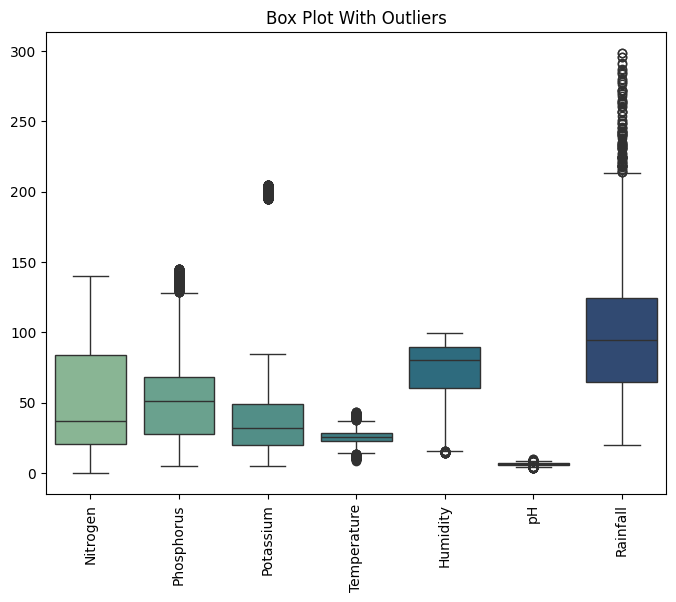

In [32]:
# Check for outliers in the variables using boxplot as a whole
plt.figure(figsize=(8, 6))
sns.boxplot(data = data_1, orient="v", palette="crest")
plt.xticks(rotation = 90)
plt.title("Box Plot With Outliers")
plt.show()

In [33]:
# Pearson vs Spearman Correlation
pearson_corr = data[features].corr(method='pearson')
spearman_corr = data[features].corr(method='spearman')

In [34]:
pearson_corr

,Nitrogen,Phosphorus,Potassium,Temperature,Humidity,pH,Rainfall
Nitrogen,1.000000,-0.231460,-0.140512,0.026501,0.190687,0.096761,0.059021
Phosphorus,-0.231460,1.000000,0.736232,-0.127538,-0.118732,-0.138022,-0.063840
Potassium,-0.140512,0.736232,1.000000,-0.160389,0.190860,-0.169477,-0.053461
Temperature,0.026501,-0.127538,-0.160389,1.000000,0.205326,-0.017919,-0.030082
Humidity,0.190687,-0.118732,0.190860,0.205326,1.000000,-0.008502,0.094418
pH,0.096761,-0.138022,-0.169477,-0.017919,-0.008502,1.000000,-0.109167
Rainfall,0.059021,-0.063840,-0.053461,-0.030082,0.094418,-0.109167,1.000000


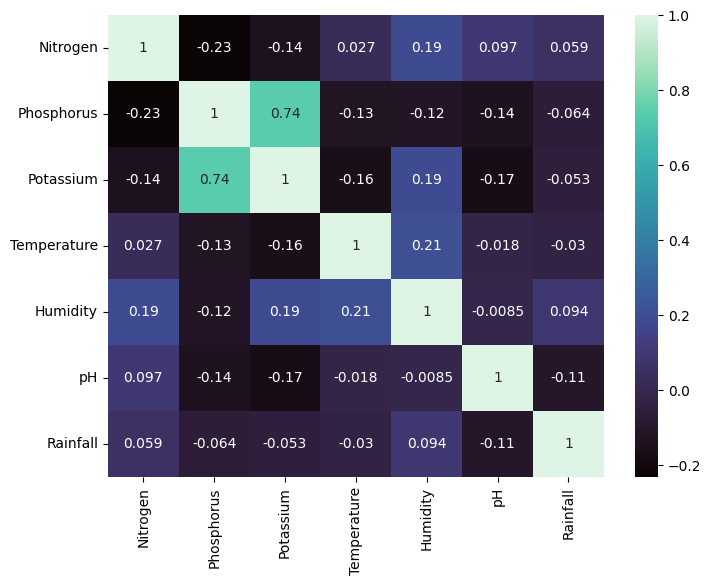

In [35]:
#Visualizing the correlation of variable
plt.figure(figsize=(8, 6))
cmap = sns.color_palette("mako", as_cmap=True)
sns.heatmap(pearson_corr, annot=True, cmap=cmap)
plt.show()

In [36]:
spearman_corr

,Nitrogen,Phosphorus,Potassium,Temperature,Humidity,pH,Rainfall
Nitrogen,1.000000,-0.162625,0.208248,0.022375,0.061113,0.141897,0.011423
Phosphorus,-0.162625,1.000000,0.195161,-0.137640,-0.309225,-0.119021,-0.032449
Potassium,0.208248,0.195161,1.000000,-0.081086,0.279497,-0.155322,0.069914
Temperature,0.022375,-0.137640,-0.081086,1.000000,0.124201,0.027715,-0.152024
Humidity,0.061113,-0.309225,0.279497,0.124201,1.000000,-0.007324,0.100702
pH,0.141897,-0.119021,-0.155322,0.027715,-0.007324,1.000000,-0.151343
Rainfall,0.011423,-0.032449,0.069914,-0.152024,0.100702,-0.151343,1.000000


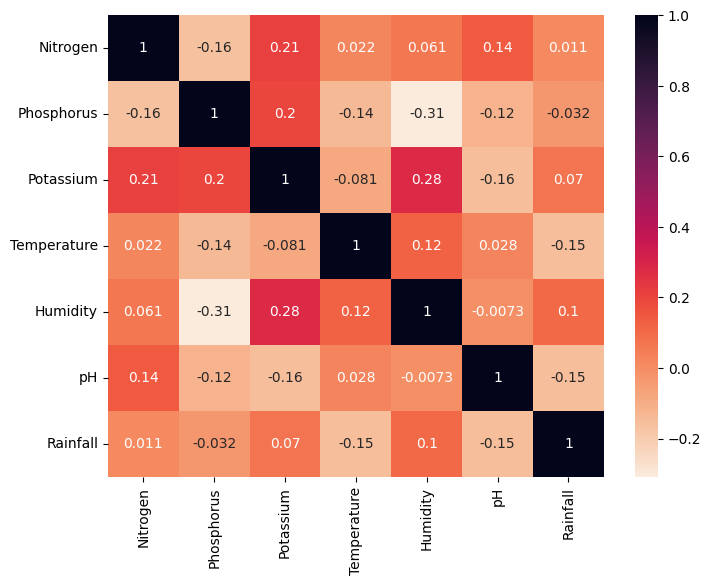

In [37]:
#Visualizing the correlation of variable
plt.figure(figsize=(8, 6))
cmap = sns.color_palette("rocket_r", as_cmap=True)
sns.heatmap(spearman_corr, annot=True, cmap=cmap)
plt.show()

In [38]:
# Mutual Information (MI)
X = data_1.drop(columns='Crop')
y = data_1['Crop']
mi_scores = mutual_info_classif(X, y, discrete_features = False, random_state = 42)
mi_ranking = pd.Series(mi_scores, index = X.columns).sort_values(ascending = False)
print(mi_ranking)

Humidity       1.730966
Potassium      1.639248
Rainfall       1.637054
Phosphorus     1.304026
Temperature    1.016329
Nitrogen       1.000392
pH             0.689083
dtype: float64


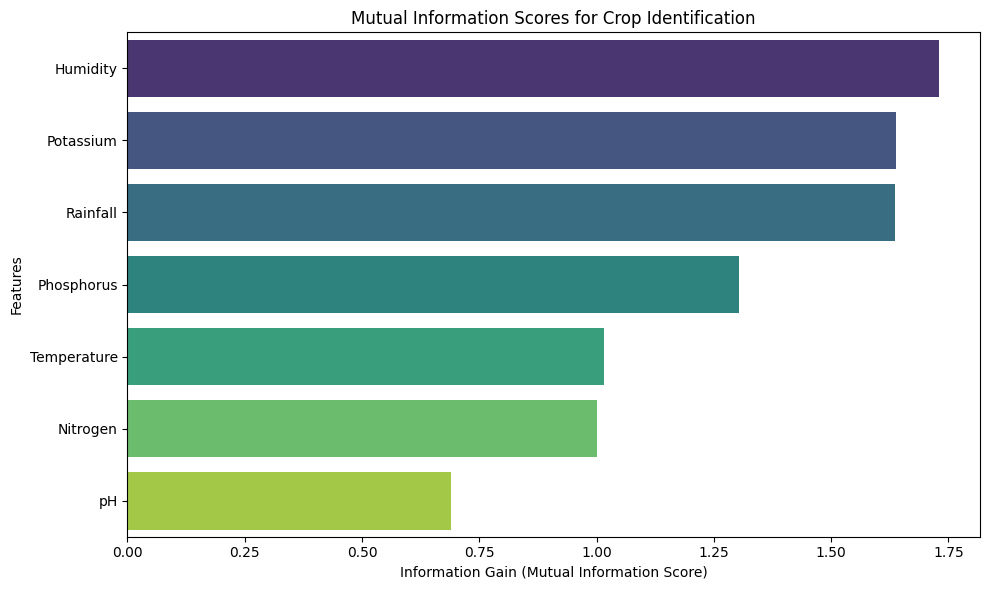

In [39]:
# Mutual Information (MI) Crop
plt.figure(figsize=(10, 6))
sns.barplot(x = mi_ranking.values, y = mi_ranking.index, hue = mi_ranking.index, palette = 'viridis', legend = False)
plt.title('Mutual Information Scores for Crop Identification')
plt.xlabel('Information Gain (Mutual Information Score)')
plt.ylabel('Features')
plt.tight_layout()

In [41]:
# Multicolinearity Check (VIF)
from statsmodels.stats.outliers_influence import variance_inflation_factor
X_vif = data.assign(const=1)
vif_data = pd.DataFrame()
vif_data["feature"] = X_vif.columns
vif_data["VIF"] = [
    variance_inflation_factor(X_vif.values, i) 
    for i in range(len(X_vif.columns))]
vif_results = (
    vif_data[vif_data['feature'] != 'const']
    .sort_values(by="VIF", ascending=False)
    .reset_index(drop=True))
print("VIF Results:")
print(vif_results)

VIF Results:
       feature       VIF
0    Potassium  2.797110
1   Phosphorus  2.630466
2     Humidity  1.368989
3  Temperature  1.111126
4     Nitrogen  1.097040
5           pH  1.055848
6     Rainfall  1.037454


In [42]:
# Checking the detailed statistics for each crop using interactive analysis

@interact
def summary(crops = list(data_1["Crop"].value_counts().index)):
    x = data_1[data_1["Crop"]== crops]
    y = data_1.drop(["Crop"],axis=1)
    m = []
    m.append(y)
    for i in y:
        print("Statistics for", i)    
        print("Minimum", i , "required:", x[i].min())
        print("Average", i ,"required:", x[i].mean())
        print("Maximum" , i ,"required:", x[i].max())
        print("...........................................")

interactive(children=(Dropdown(description='crops', options=('rice', 'maize', 'chickpea', 'kidneybeans', 'pige…

In [43]:
# Comparing Average requirement and conditions for each crop using interactive analysis

@interact
def compare(conditions = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'pH', 'Humidity', 'Rainfall']):
    print("Average Value for", conditions, "is {0:.2f}".format(data_1[conditions].mean()))
    print("...........................................")
    print("Rice : {0:.2f}".format(data_1[(data_1["Crop"] == 'rice')][conditions].mean()))
    print("Black grams : {0:.2f}".format(data_1[(data_1["Crop"] == 'blackgram')][conditions].mean()))
    print("Banana : {0:.2f}".format(data_1[(data_1["Crop"] == 'banana')][conditions].mean()))
    print("Jute : {0:.2f}".format(data_1[(data_1["Crop"] == 'jute')][conditions].mean()))
    print("Coconut : {0:.2f}".format(data_1[(data_1["Crop"] == 'coconut')][conditions].mean()))
    print("Apple : {0:.2f}".format(data_1[(data_1["Crop"] == 'apple')][conditions].mean()))
    print("Papaya : {0:.2f}".format(data_1[(data_1["Crop"] == 'papaya')][conditions].mean()))
    print("Muskmelon : {0:.2f}".format(data_1[(data_1["Crop"] == 'muskmelon')][conditions].mean()))
    print("Grapes : {0:.2f}".format(data_1[(data_1["Crop"] == 'grapes')][conditions].mean()))
    print("Watermelon : {0:.2f}".format(data_1[(data_1["Crop"] == 'watermelon')][conditions].mean()))
    print("Kidney Beans : {0:.2f}".format(data_1[(data_1["Crop"] == 'kidneybeans')][conditions].mean()))
    print("Mung Beans : {0:.2f}".format(data_1[(data_1["Crop"] == 'mungbean')][conditions].mean()))
    print("Oranges : {0:.2f}".format(data_1[(data_1["Crop"] == 'orange')][conditions].mean()))
    print("Chick Peas : {0:.2f}".format(data_1[(data_1["Crop"] == 'chickpea')][conditions].mean()))
    print("Lentils : {0:.2f}".format(data_1[(data_1["Crop"] == 'lentil')][conditions].mean()))
    print("Cotton : {0:.2f}".format(data_1[(data_1["Crop"] == 'cotton')][conditions].mean()))
    print("Maize : {0:.2f}".format(data_1[(data_1["Crop"] == 'maize')][conditions].mean()))
    print("Moth Beans : {0:.2f}".format(data_1[(data_1["Crop"] == 'mothbeans')][conditions].mean()))
    print("Pigeon Peas : {0:.2f}".format(data_1[(data_1["Crop"] == 'pigeonpeas')][conditions].mean()))
    print("Mango : {0:.2f}".format(data_1[(data_1["Crop"] == 'mango')][conditions].mean()))
    print("Pomegranate : {0:.2f}".format(data_1[(data_1["Crop"] == 'pomegranate')][conditions].mean()))
    print("Coffee : {0:.2f}".format(data_1[(data_1["Crop"] == 'coffee')][conditions].mean()))

interactive(children=(Dropdown(description='conditions', options=('Nitrogen', 'Phosphorus', 'Potassium', 'Temp…

In [44]:
# Checking the below and above Average Conditions using interactive analysis

@interact
def compare(conditions = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'pH', 'Humidity', 'Rainfall']):
    print("Crops that require greater than average :", conditions, '\n')
    print(data_1[data_1[conditions] > data_1[conditions].mean()]['Crop'].unique())
    print("...........................................")
    print("Crops that require less than average :", conditions, '\n')
    print(data_1[data_1[conditions] <= data_1[conditions].mean()]['Crop'].unique())  

interactive(children=(Dropdown(description='conditions', options=('Nitrogen', 'Phosphorus', 'Potassium', 'Temp…

In [45]:
# Checking which crop to be grown according to the pH
print("Acidic Requirements: ")
print(data_1[(data_1['pH'] <= 6.99)]['Crop'].unique())
print("...........................................")
print("Normal Requirements: ")
print(data_1[(data_1['pH'] == 7.00)]['Crop'].unique())
print("...........................................")
print("Alkailic Requirements: ")
print(data_1[(data_1['pH'] >= 7.01)]['Crop'].unique())

Acidic Requirements: 
['rice' 'maize' 'chickpea' 'kidneybeans' 'pigeonpeas' 'mothbeans'
 'mungbean' 'blackgram' 'lentil' 'pomegranate' 'banana' 'mango' 'grapes'
 'watermelon' 'muskmelon' 'apple' 'orange' 'papaya' 'coconut' 'cotton'
 'jute' 'coffee']
...........................................
Normal Requirements: 
['maize' 'lentil' 'pomegranate' 'jute']
...........................................
Alkailic Requirements: 
['rice' 'chickpea' 'pigeonpeas' 'mothbeans' 'mungbean' 'blackgram'
 'lentil' 'pomegranate' 'orange' 'cotton' 'jute' 'coffee']


In [46]:
print("Crops that require very High Ratio of Nitrogen Content in Soil:", data_1[data_1['Nitrogen'] > 120]['Crop'].unique())
print("Crops that require very High Ratio of Phosphorous Content in Soil:", data_1[data_1['Phosphorus'] > 100]['Crop'].unique())
print("Crops that require very High Ratio of Potassium Content in Soil:", data_1[data_1['Potassium'] > 200]['Crop'].unique())
print("Crops that require very High Rainfall:", data_1[data_1['Rainfall'] > 200]['Crop'].unique())
print("Crops that require very Low Temperature:", data_1[data_1['Temperature'] < 10]['Crop'].unique())
print("Crops that require very High Temperature:", data_1[data_1['Temperature'] > 40]['Crop'].unique())
print("Crops that require very Low Humidity:", data_1[data_1['Humidity'] < 20]['Crop'].unique())
print("Crops that require very Low pH:", data_1[data_1['pH'] < 4]['Crop'].unique())
print("Crops that require very High pH:", data_1[data_1['pH'] > 9]['Crop'].unique())

Crops that require very High Ratio of Nitrogen Content in Soil: ['cotton']
Crops that require very High Ratio of Phosphorous Content in Soil: ['grapes' 'apple']
Crops that require very High Ratio of Potassium Content in Soil: ['grapes' 'apple']
Crops that require very High Rainfall: ['rice' 'papaya' 'coconut']
Crops that require very Low Temperature: ['grapes']
Crops that require very High Temperature: ['grapes' 'papaya']
Crops that require very Low Humidity: ['chickpea' 'kidneybeans']
Crops that require very Low pH: ['mothbeans']
Crops that require very High pH: ['mothbeans']


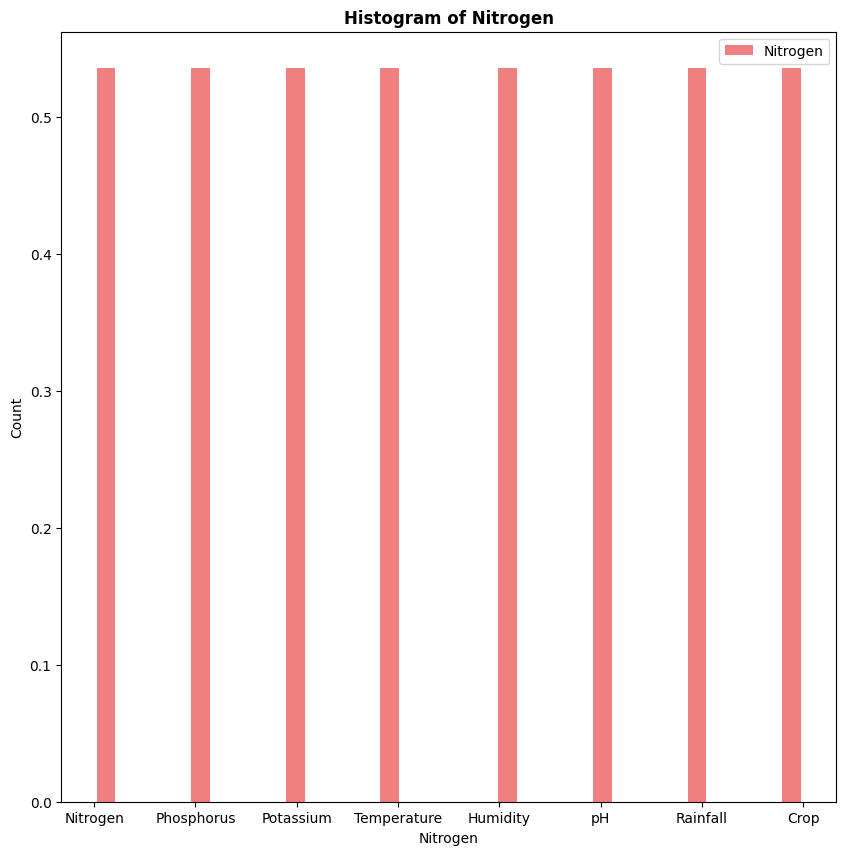

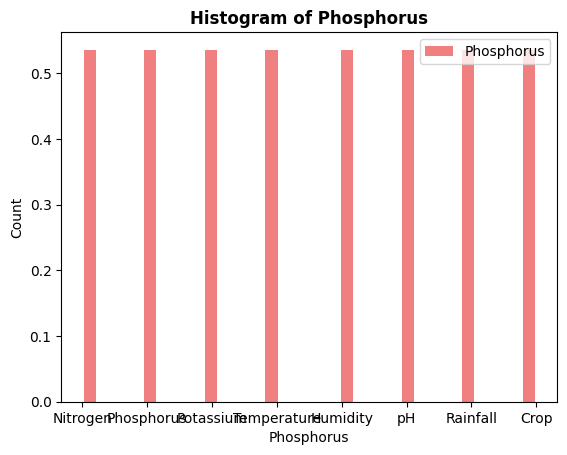

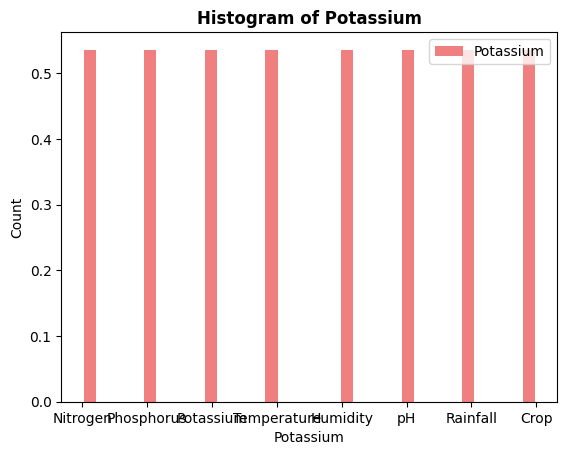

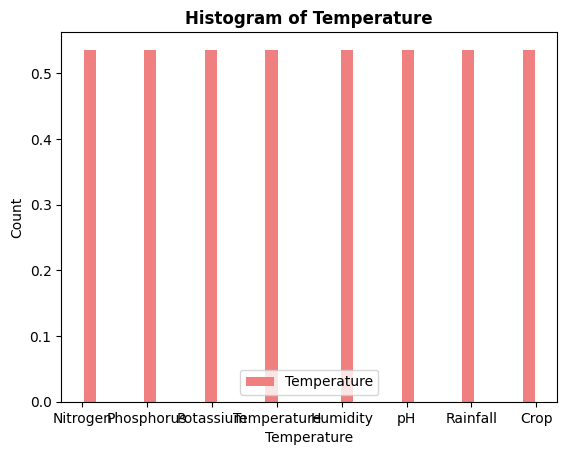

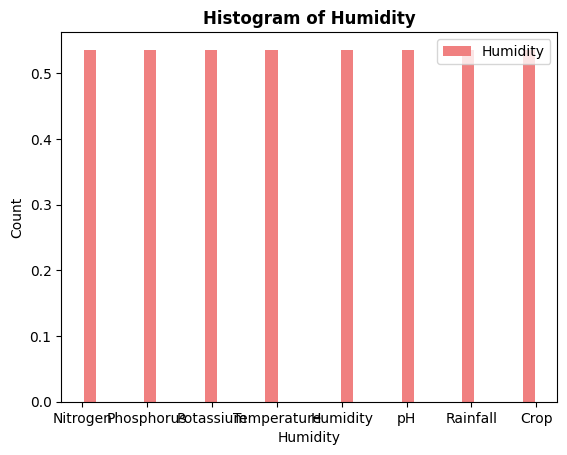

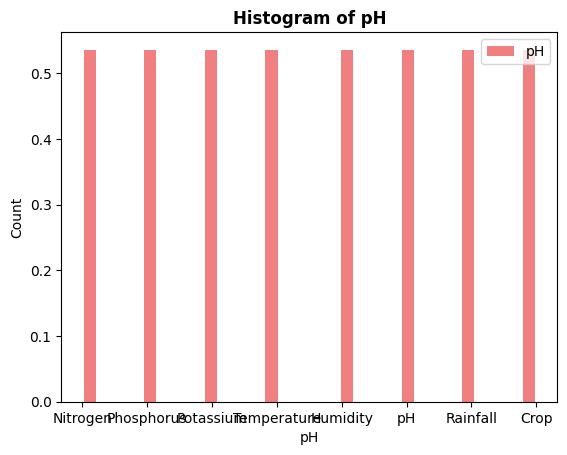

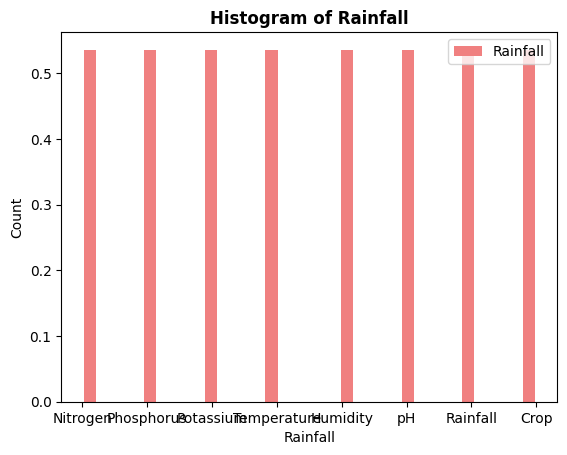

In [47]:
# Histogram
x = data_1.columns
plt.figure(figsize=(10, 10))
colors = ["lightcoral"]
for column in data_1.columns[:-1]:
    plt.hist(x, bins = 30, density = True, histtype ='bar', color = colors, label = column, rwidth = 0.8)
    plt.legend(prop ={'size': 10})
    plt.title(f'Histogram of {column}', fontweight ="bold")
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.show()

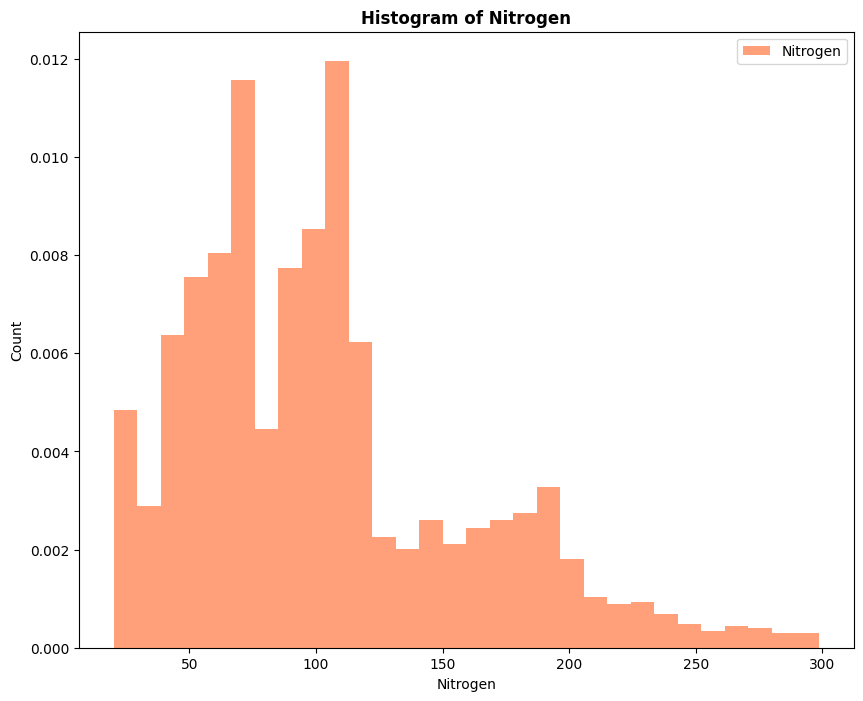

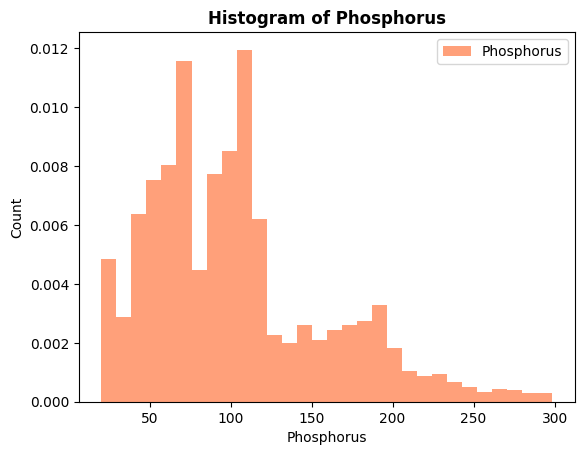

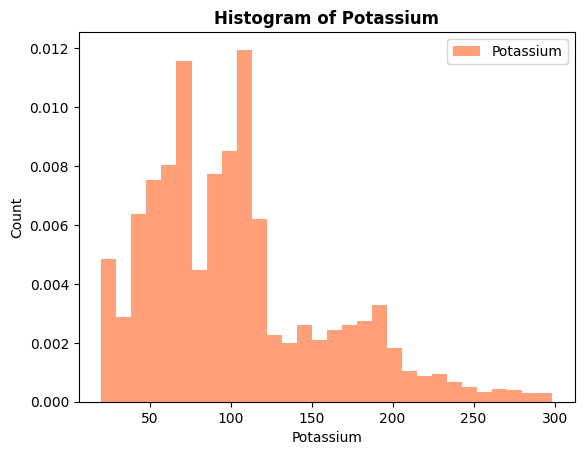

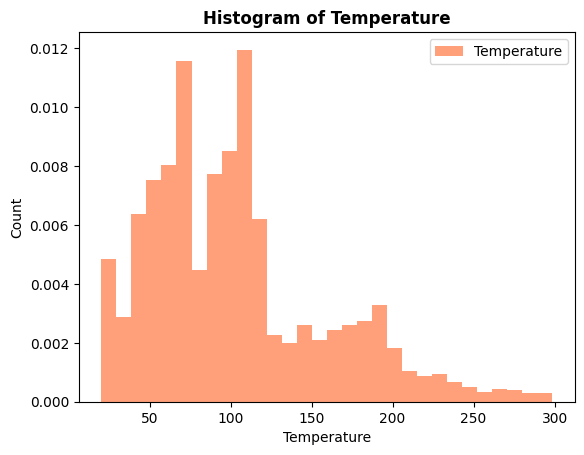

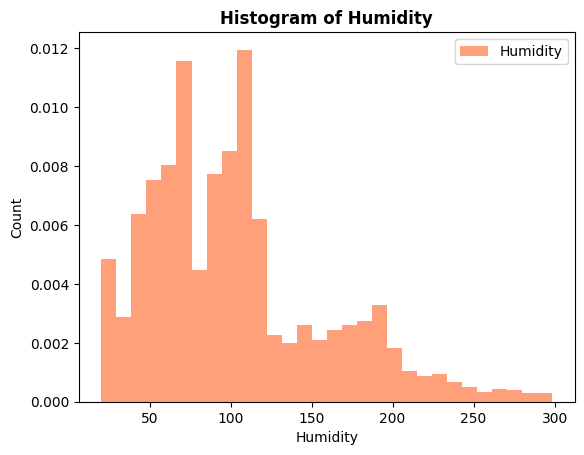

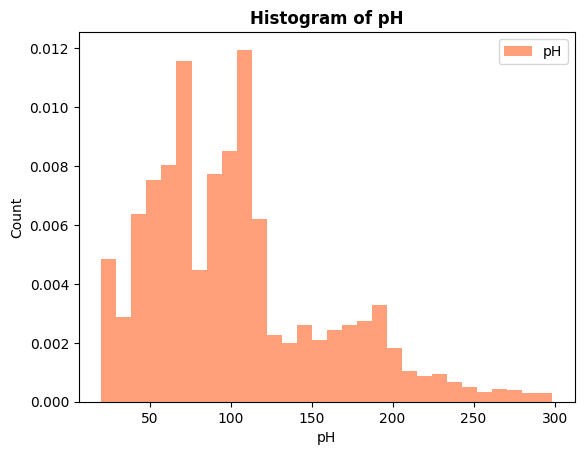

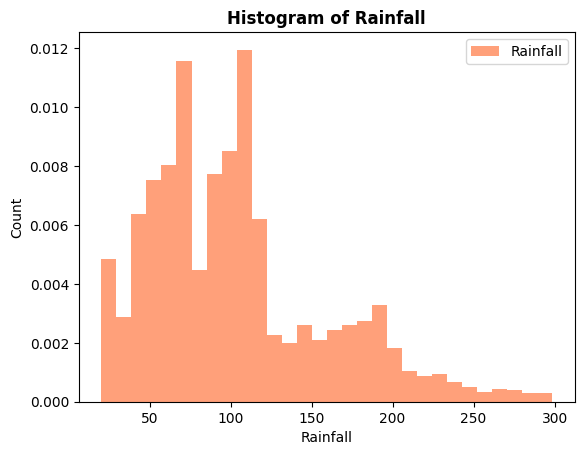

In [48]:
# Hist Plot
x = data_1[column]
plt.figure(figsize=(10, 8))
colors = ["lightsalmon"]
for column in data_1.columns[:-1]:
    plt.hist(x, bins = 30, density = True, color = colors, label = column)
    plt.legend(prop ={'size': 10})
    plt.title(f'Histogram of {column}', fontweight ="bold")
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.show()

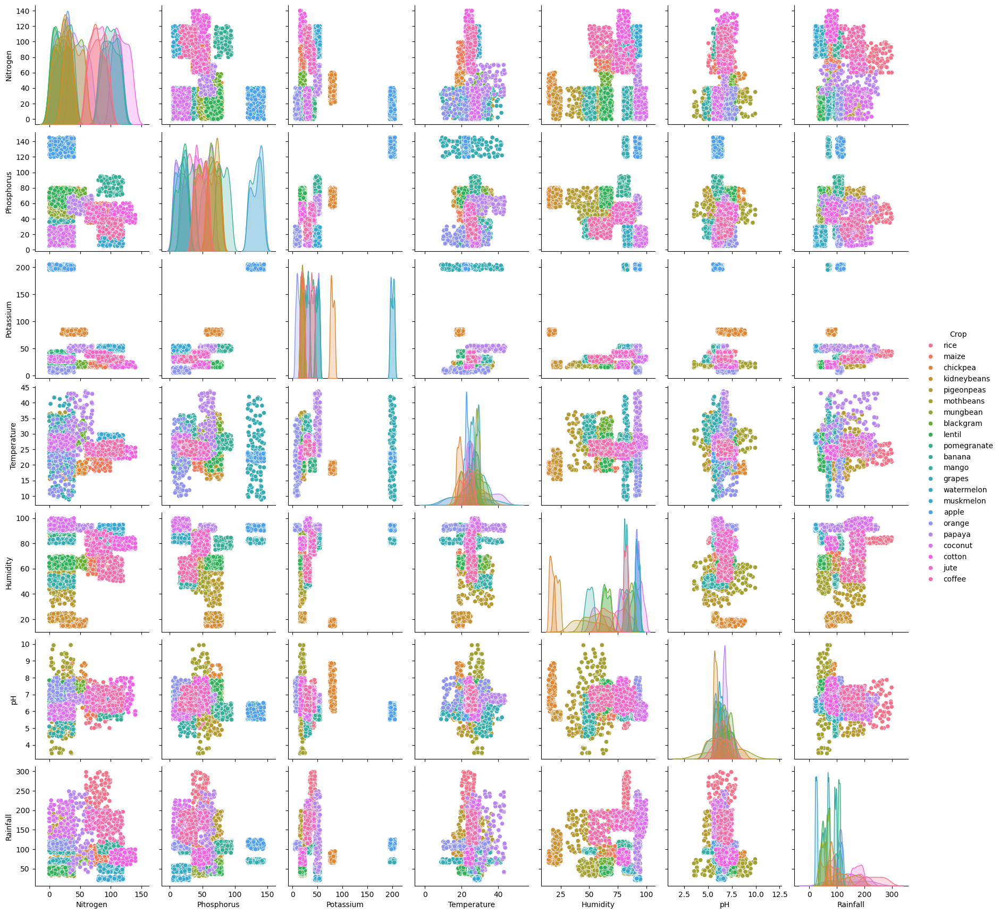

In [49]:
# Pair Plot
hue_variable = "Crop"
sns.pairplot(data_1, hue = hue_variable)
plt.show()

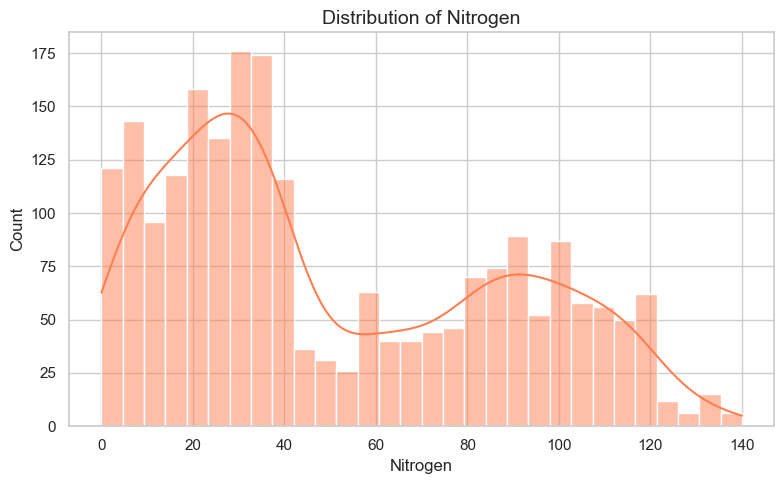

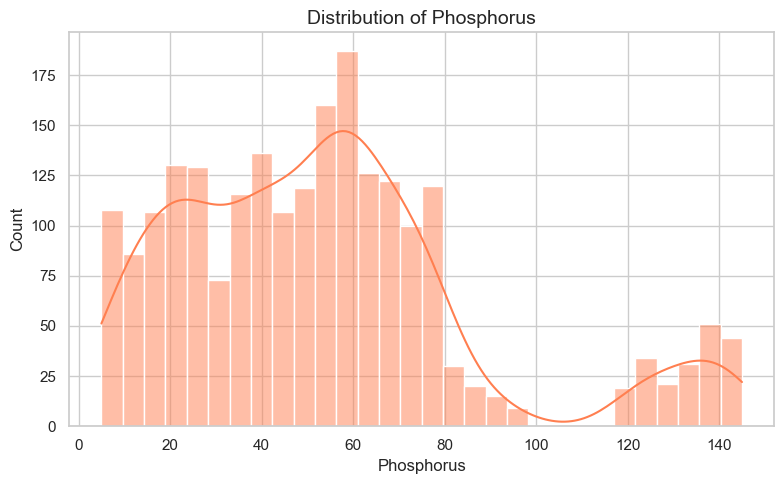

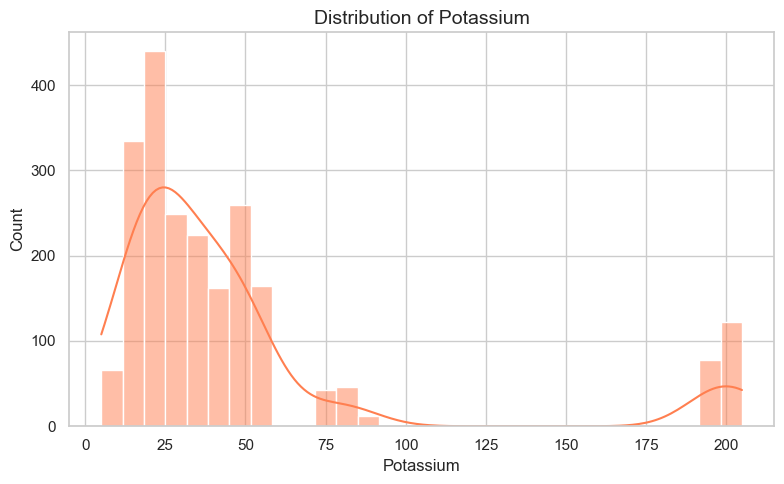

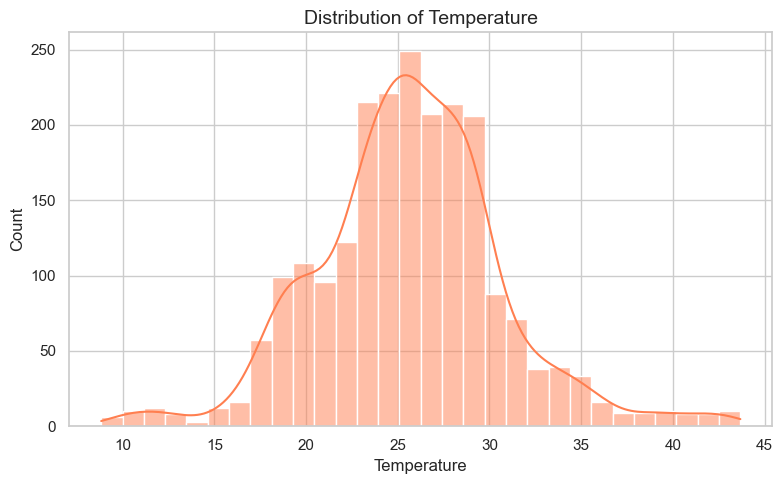

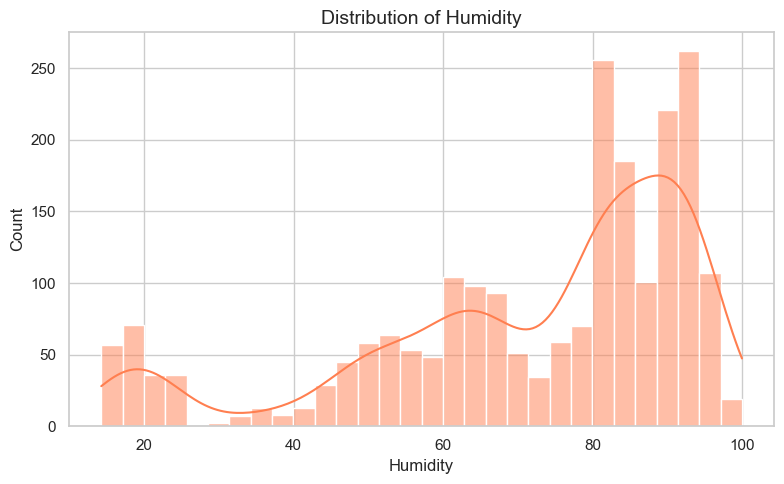

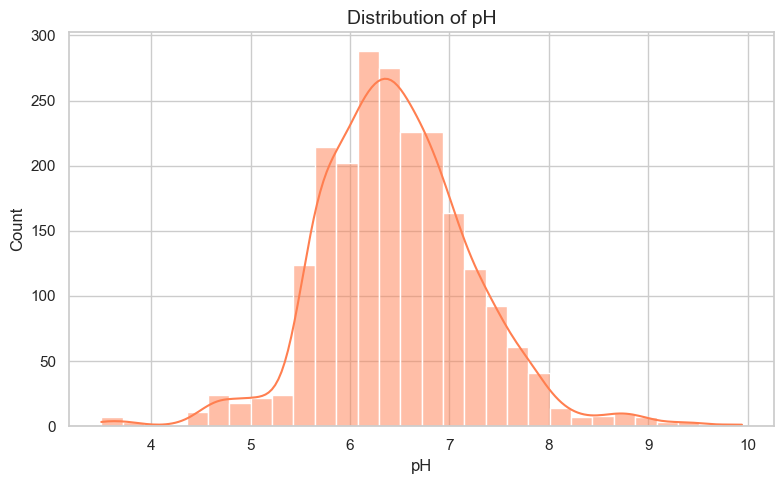

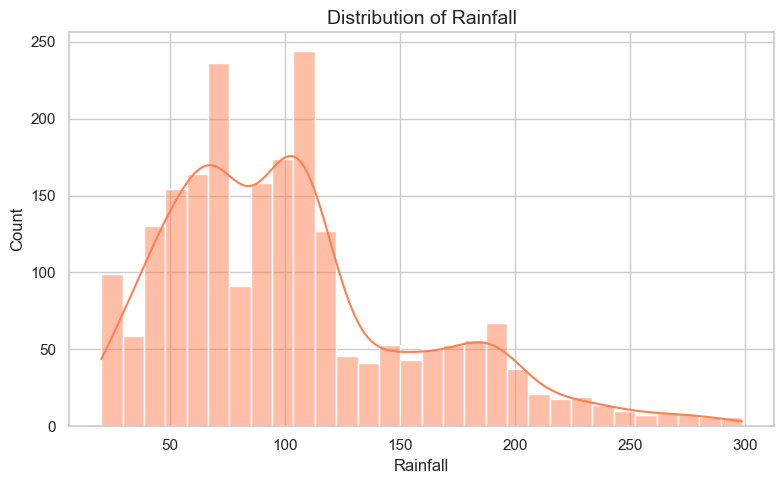

In [3]:
# Histogram with curve
sns.set_theme(style="whitegrid")
plot_color = "coral"
for column in data_1.columns[:-1]:
    plt.figure(figsize=(8, 5))
    sns.histplot(data=data_1, x=column, bins=30, kde=True, color=plot_color)
    plt.xlabel(column, fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.title(f'Distribution of {column}', fontsize=14)
    plt.tight_layout()
    plt.show()

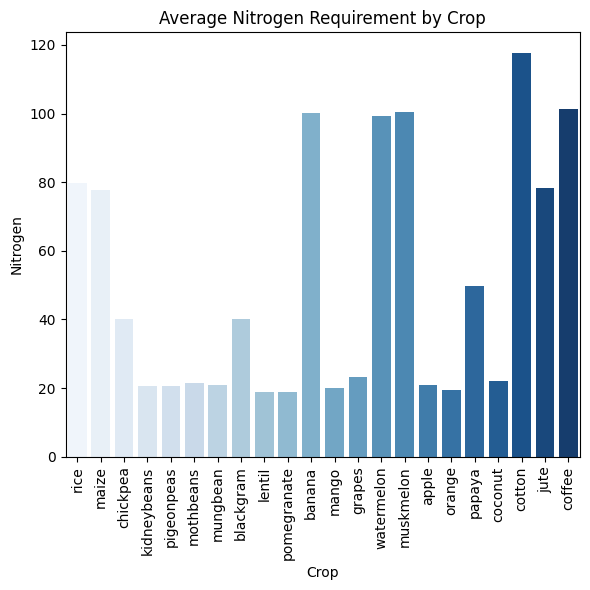

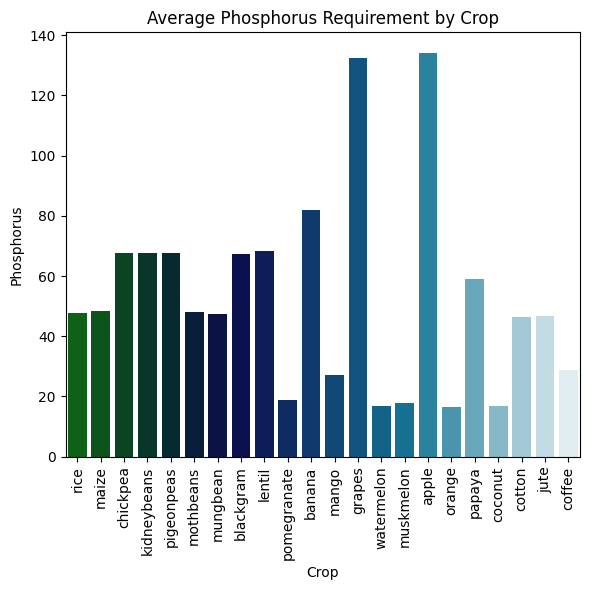

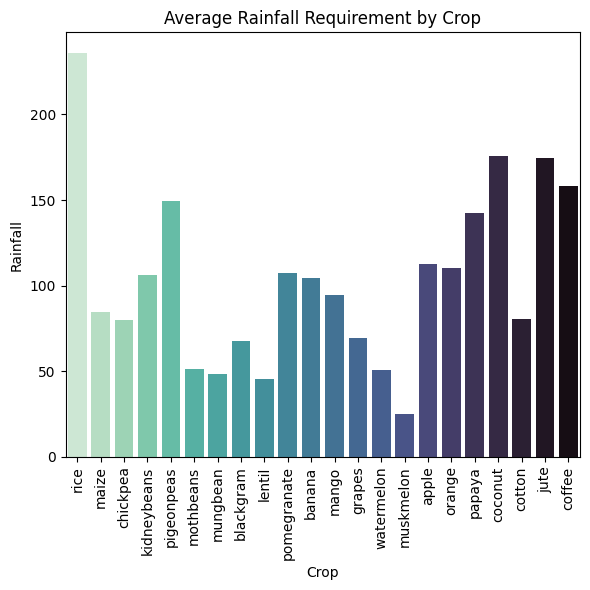

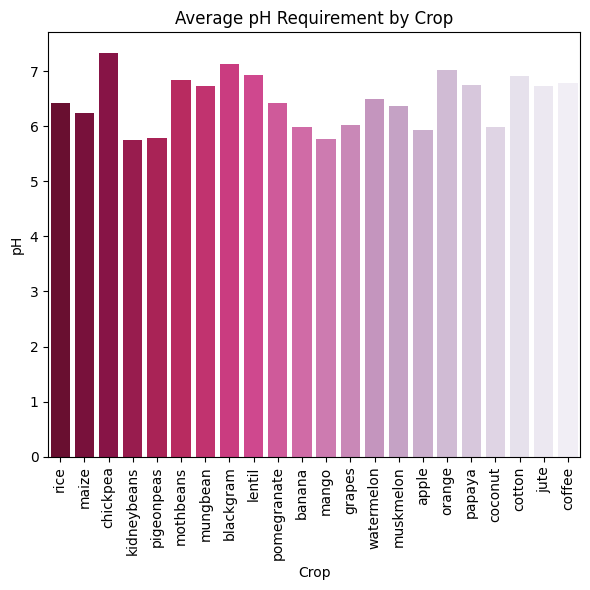

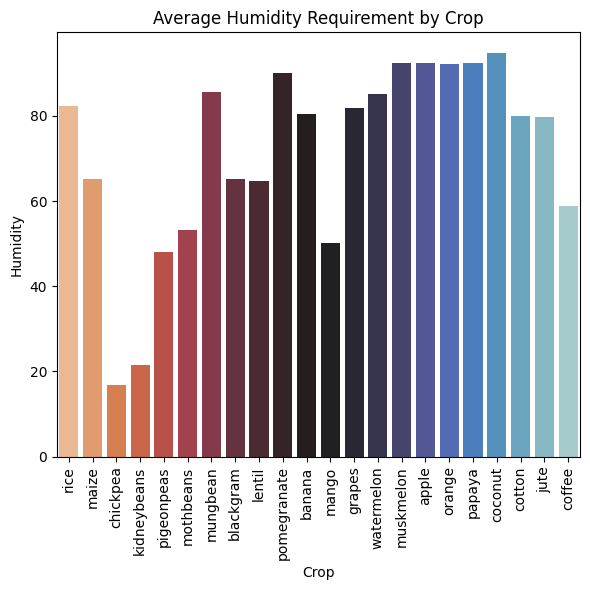

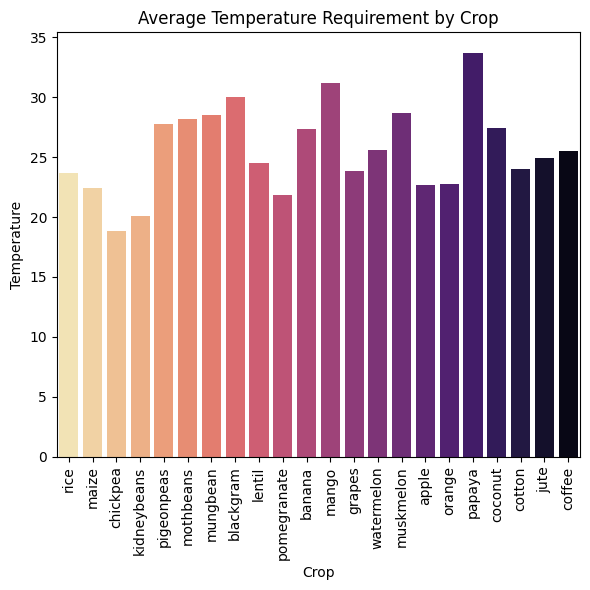

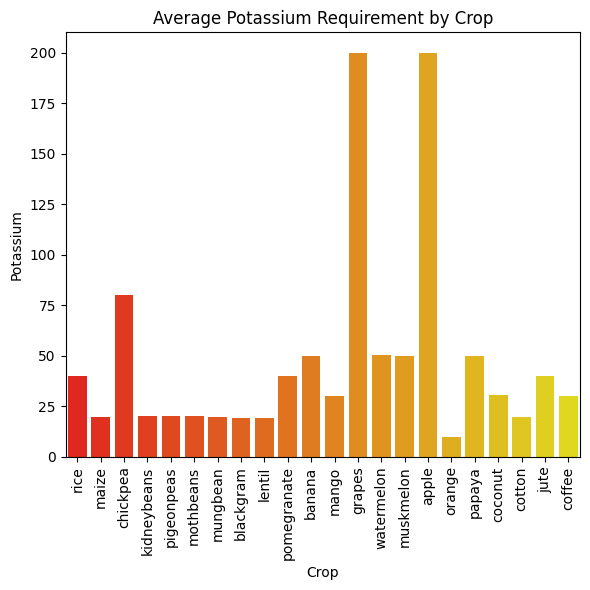

In [50]:
# Bar Chart
features = ['Nitrogen', 'Phosphorus', 'Rainfall', 'pH', 'Humidity', 'Temperature', 'Potassium']
palettes = ["Blues", "ocean", "mako_r", "PuRd_r", "icefire_r", "magma_r", "autumn"]
for feature, palette in zip(features, palettes):
    plt.figure(figsize=(6, 6))
    sns.barplot(x='Crop', y=feature, data=data_1, palette=palette, errorbar=None)
    plt.xticks(rotation=90)
    plt.title(f'Average {feature} Requirement by Crop')
    plt.tight_layout()
    plt.show()

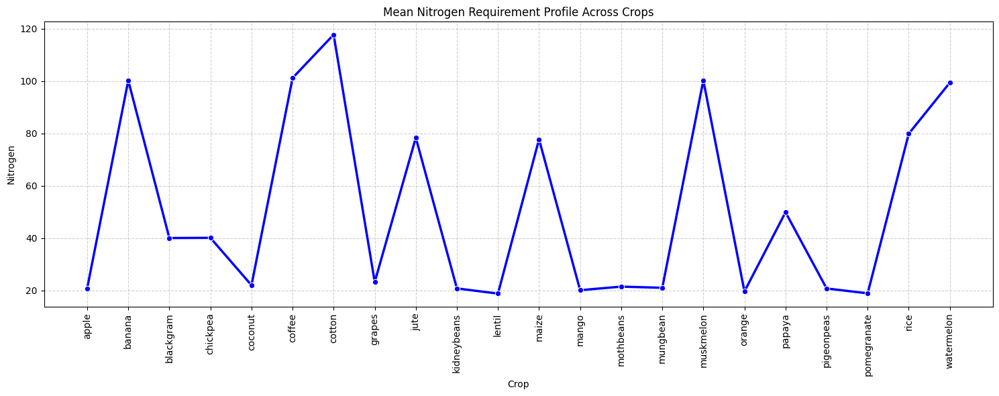

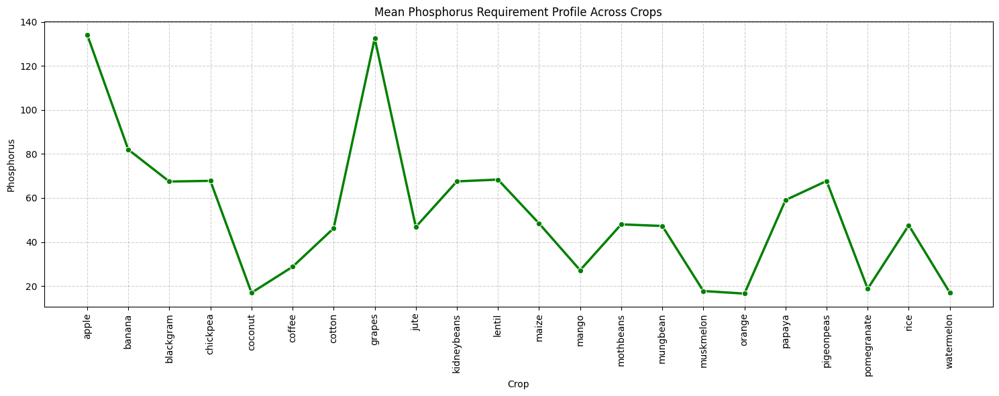

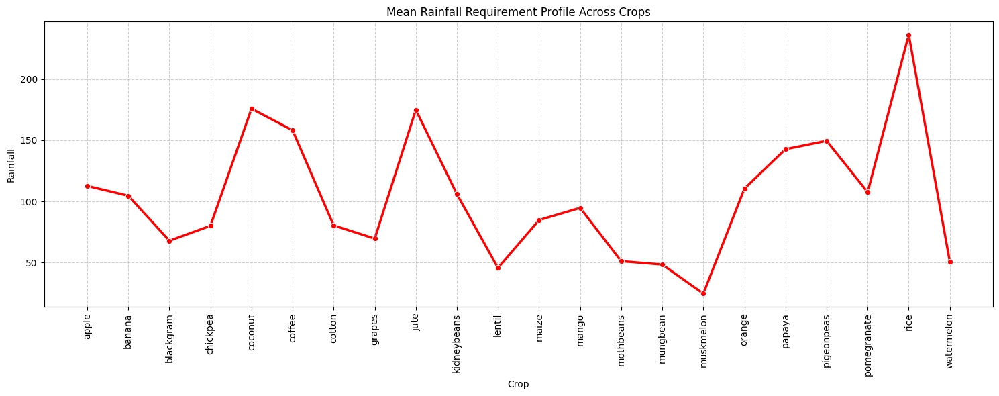

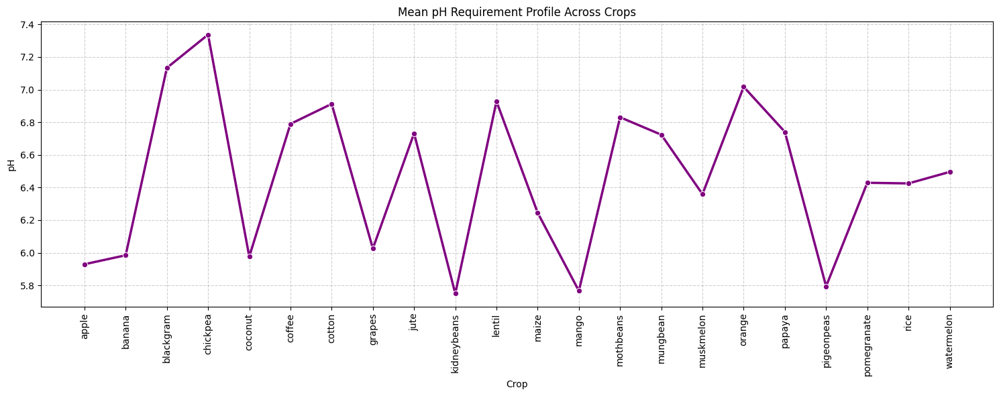

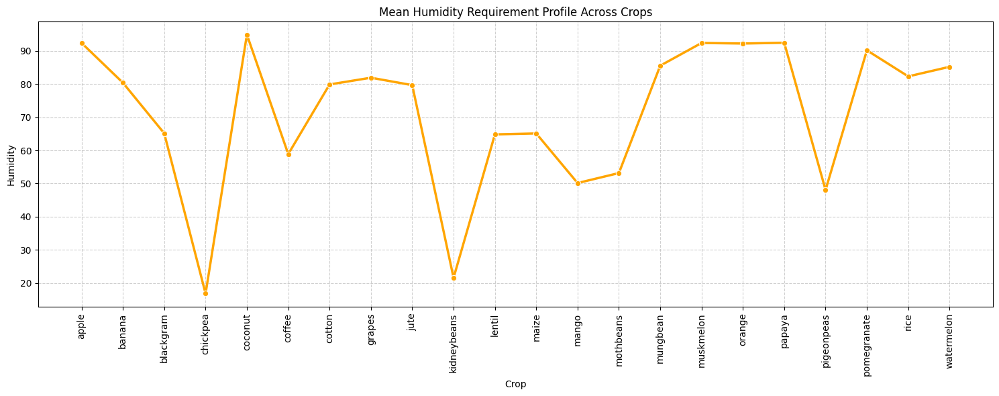

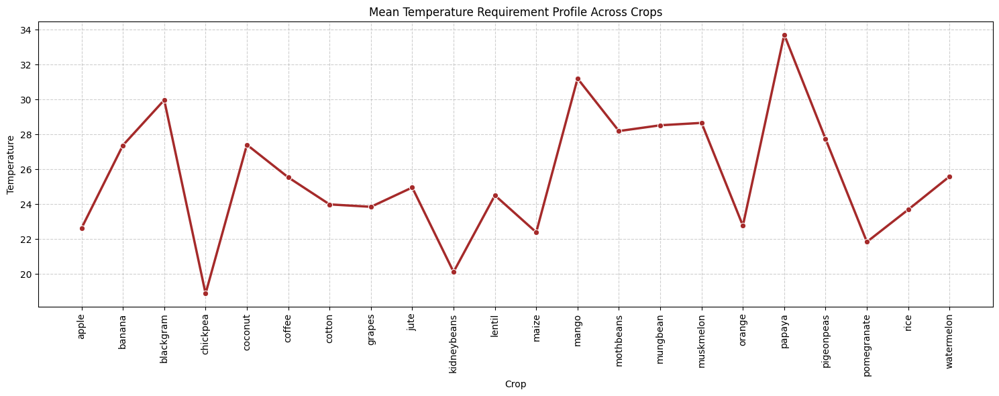

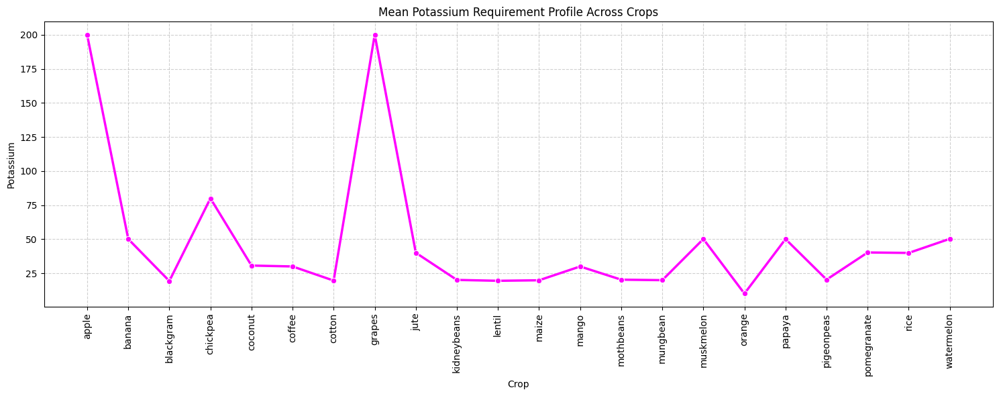

In [51]:
# Line Plot
crop_means = data_1.groupby('Crop').mean().reset_index()
features = ['Nitrogen', 'Phosphorus', 'Rainfall', 'pH', 'Humidity', 'Temperature', 'Potassium']
colors = ["blue", "green", "red", "purple", "orange", "brown", "magenta"]
for feature, color in zip(features, colors):
    plt.figure(figsize=(15, 6))
    sns.lineplot(x='Crop', y=feature, data=crop_means, marker='o', color=color, linewidth=2.5)
    plt.xticks(rotation=90)
    plt.title(f'Mean {feature} Requirement Profile Across Crops')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

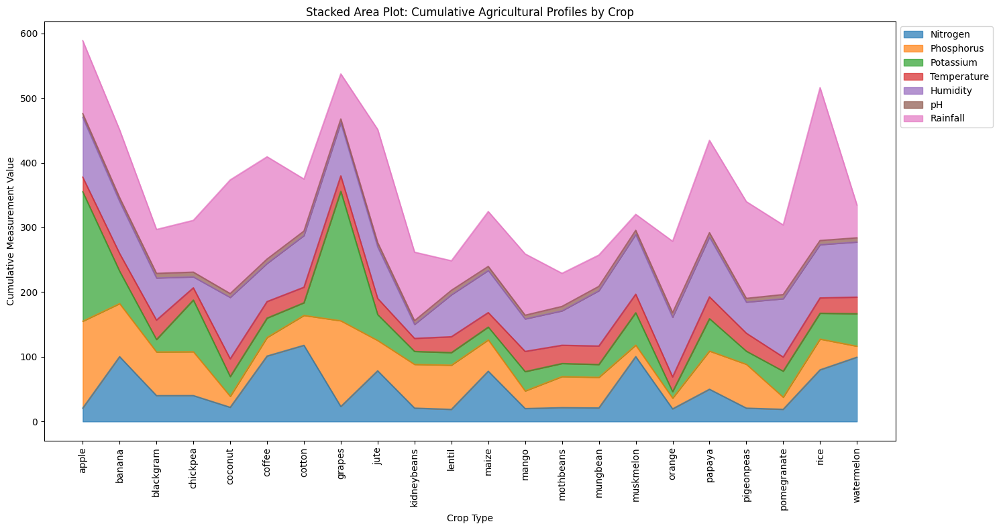

In [52]:
# Area Plot
crop_means = data_1.groupby('Crop').mean()
features = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
plot_data = crop_means[features]
plt.figure(figsize=(15, 8))
plot_data.plot.area(stacked=True, alpha=0.7, ax=plt.gca())
plt.xticks(range(len(plot_data.index)), plot_data.index, rotation=90)
plt.title('Stacked Area Plot: Cumulative Agricultural Profiles by Crop')
plt.xlabel('Crop Type')
plt.ylabel('Cumulative Measurement Value')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

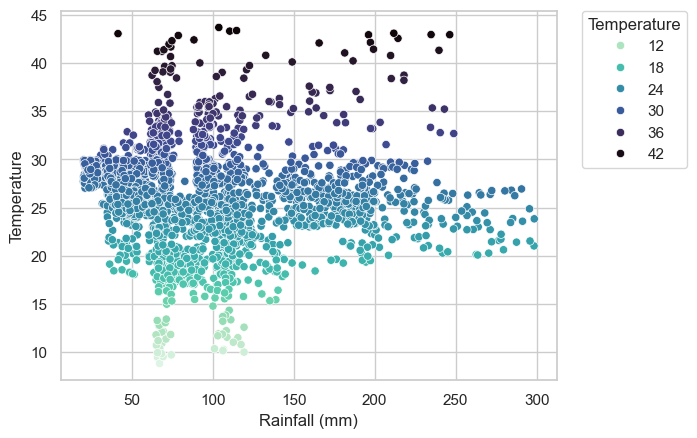

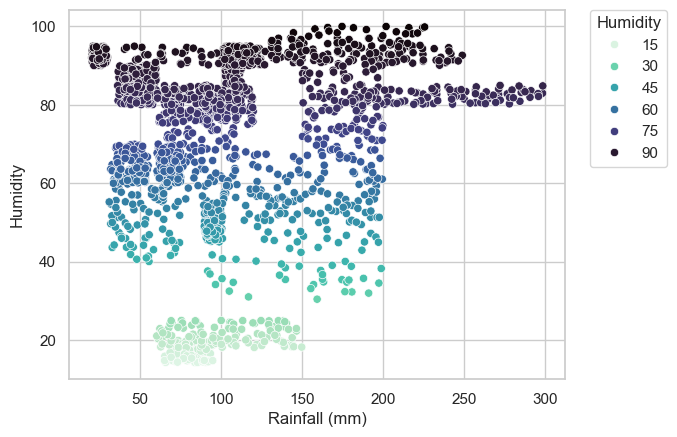

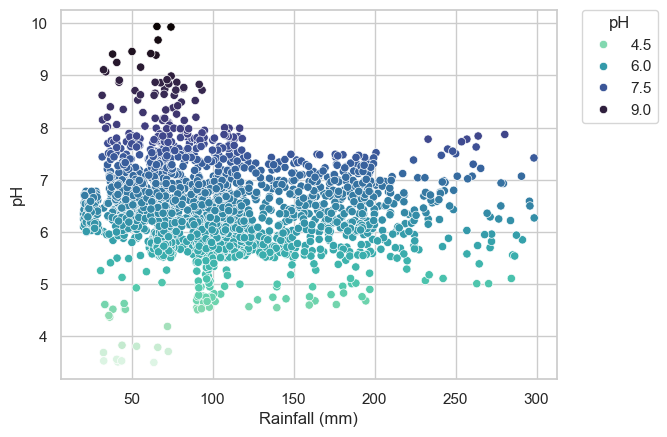

In [53]:
# Scatter plot - Relationship
data_col = ["Temperature", "Humidity", "pH"]
for i in data_col:
    sns.set(style='whitegrid')
    sns.scatterplot(x="Rainfall", y = i, hue = i, data=data_1, palette = "mako_r")
    plt.xlabel('Rainfall (mm)')
    plt.ylabel(i)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, title = i)
    plt.show()

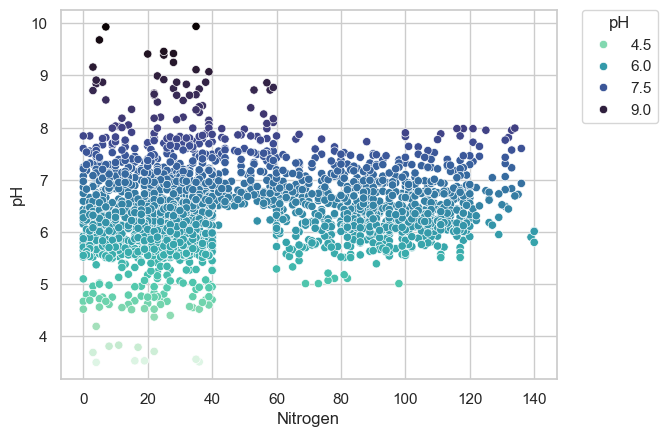

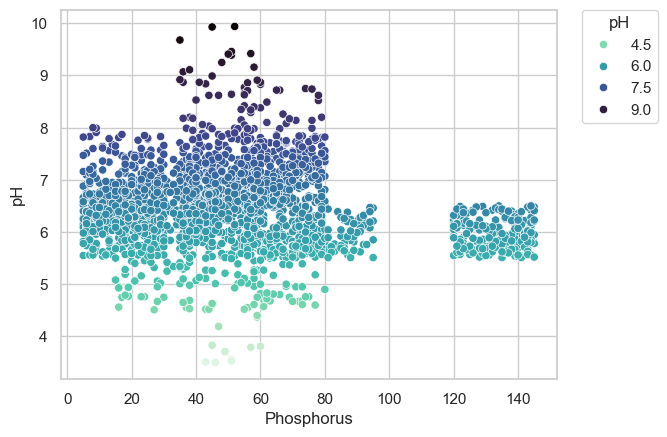

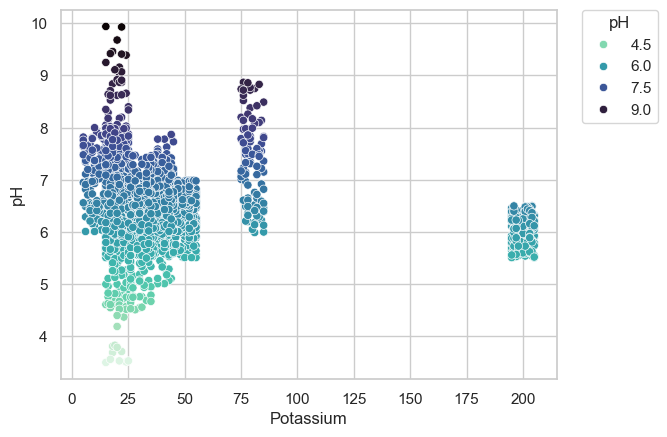

In [54]:
# Scatter Plot - Relationship
data_columns = ['Nitrogen', 'Phosphorus', 'Potassium']
for i in data_columns:
    sns.set(style='whitegrid')
    sns.scatterplot(x = i, y="pH", hue="pH", data=data_1, palette = "mako_r")
    plt.xlabel(i)
    plt.ylabel('pH')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, title = "pH")
    plt.show()

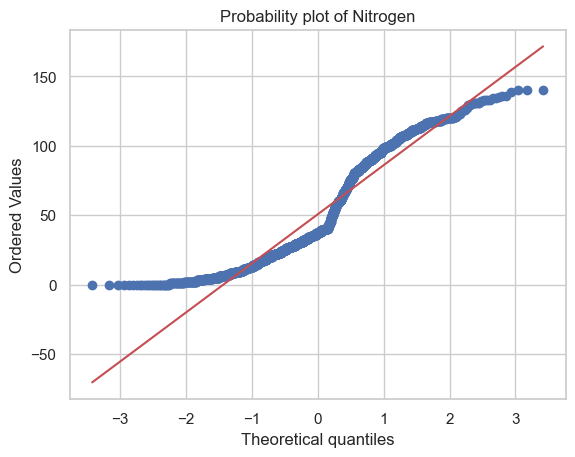

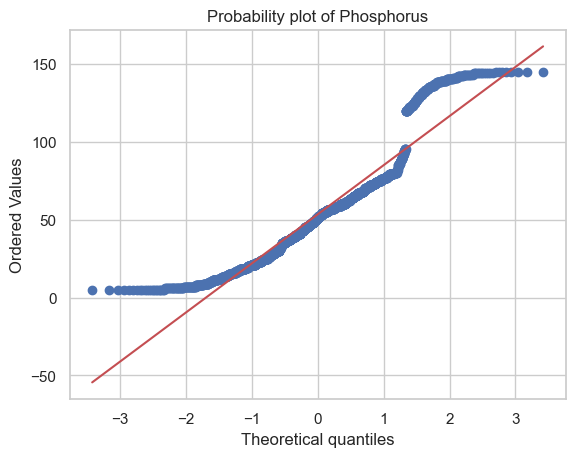

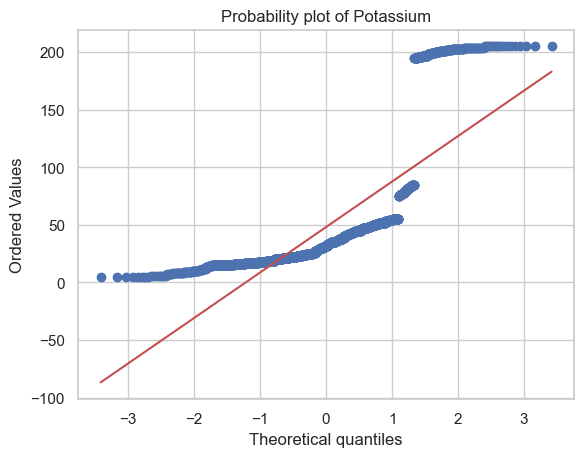

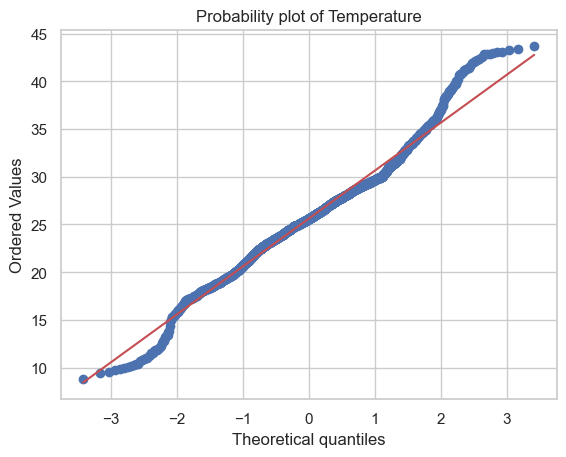

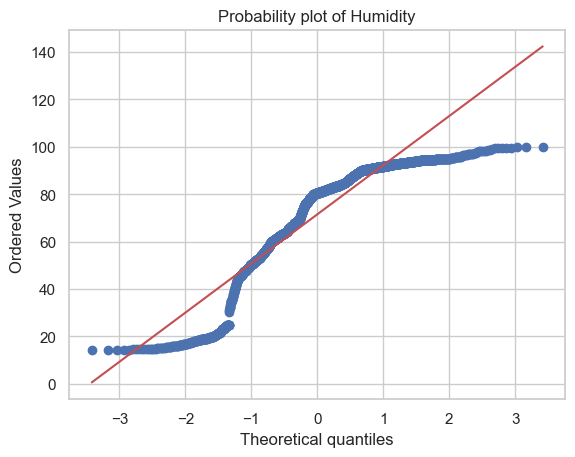

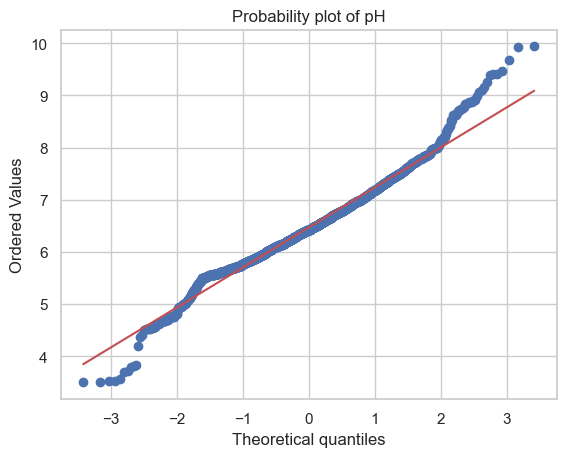

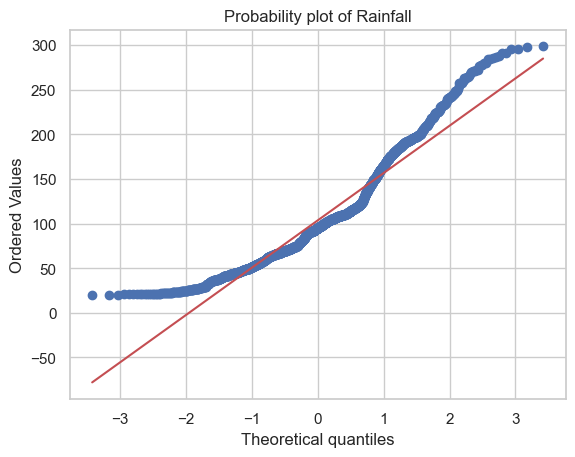

In [55]:
# Probability Plot - Normality Test
data_columns = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
for var in data_columns:
    fig, ax = plt.subplots()
    stats.probplot(data_1[var], dist = "norm", plot=ax)
    ax.set_title('Probability plot of ' + var)
    plt.show()

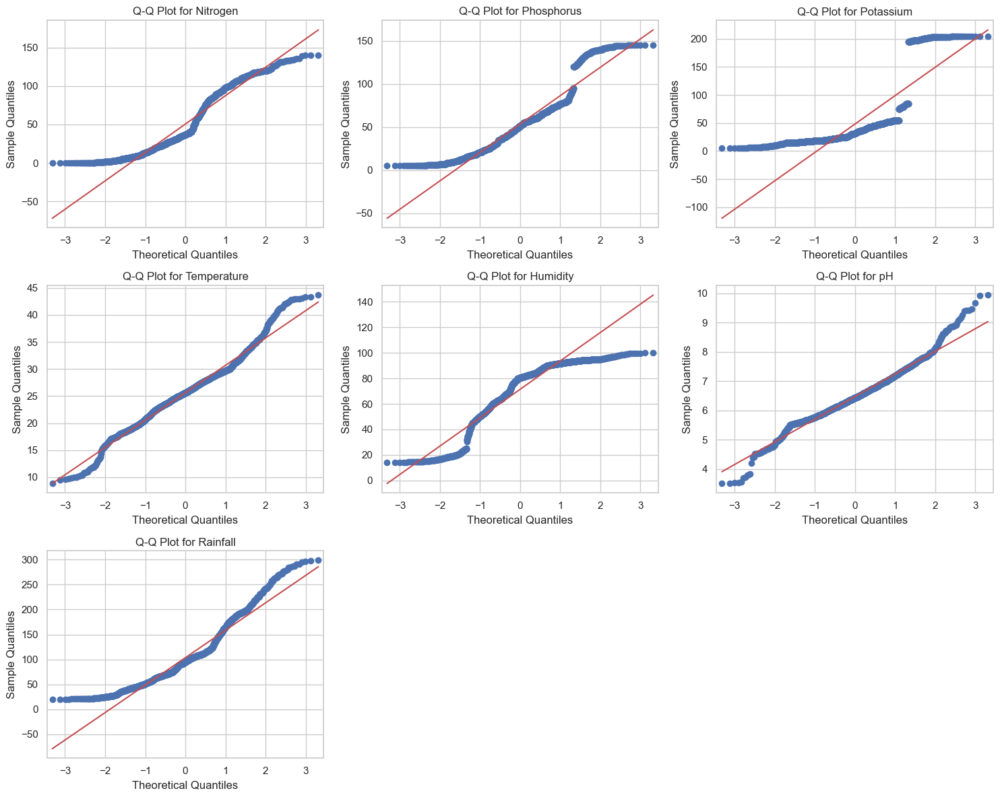

In [56]:
# Q-Q Plots - Normality Test
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15, 12))
axes = axes.flatten()
for i, feature in enumerate(features):
    sm.qqplot(data[feature], line='s', ax=axes[i])
    axes[i].set_title(f'Q-Q Plot for {feature}')
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout()
plt.show()

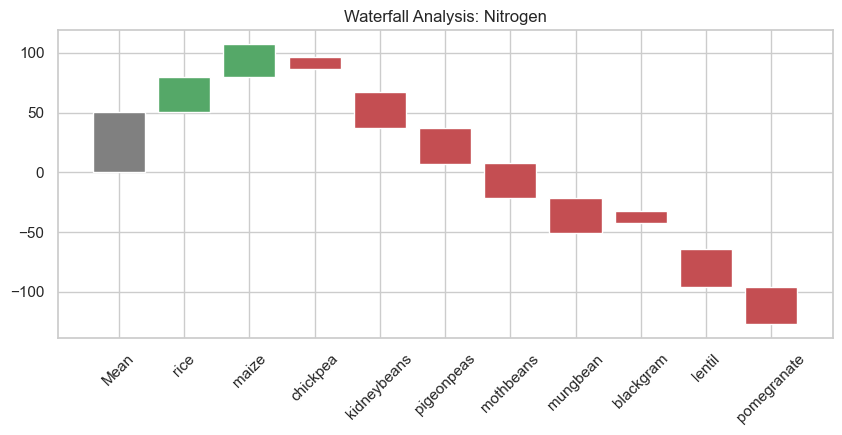

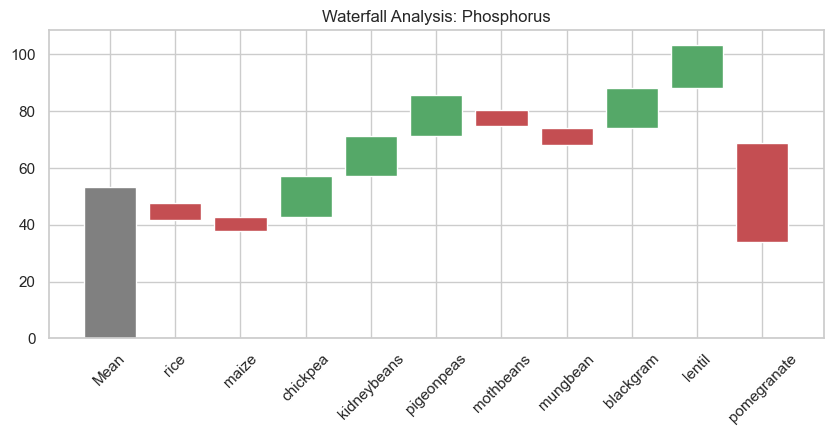

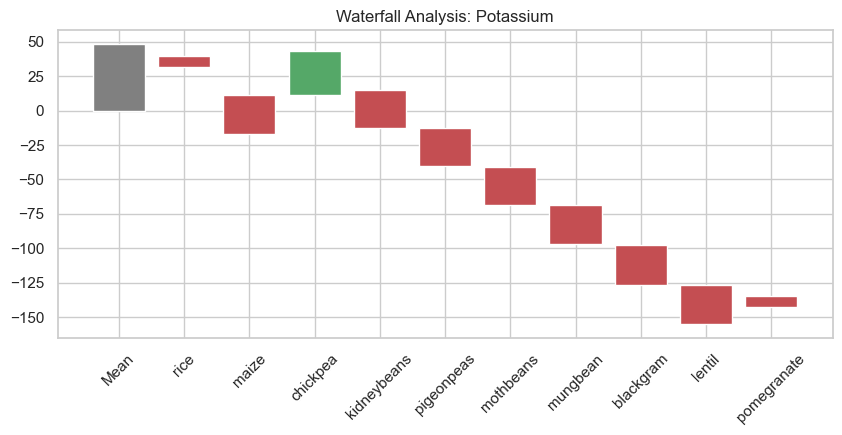

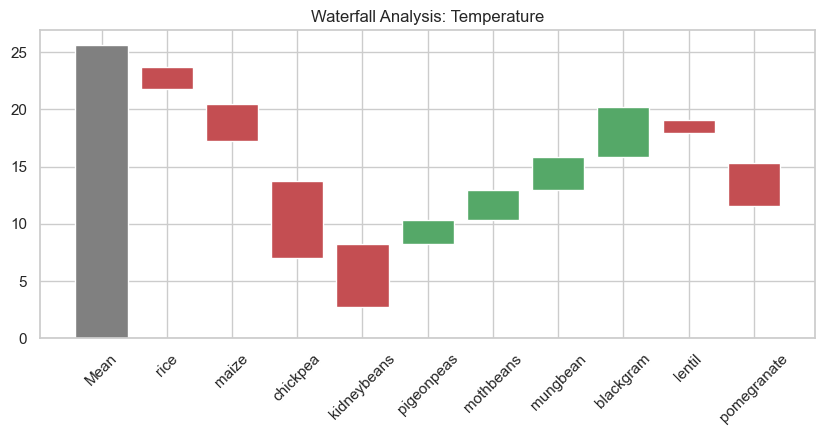

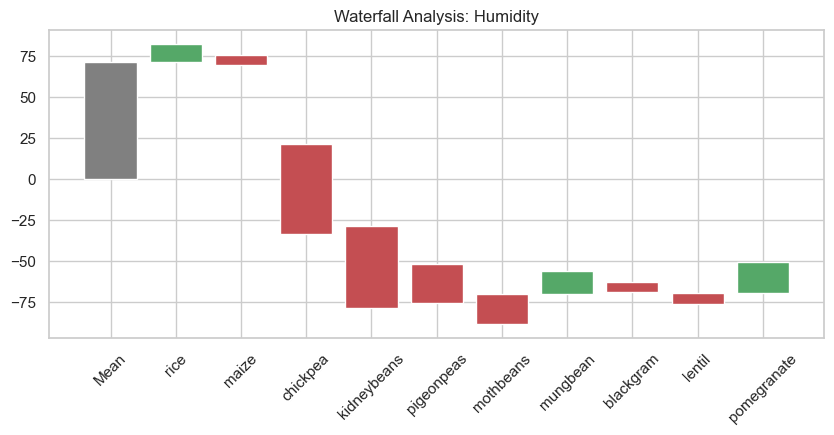

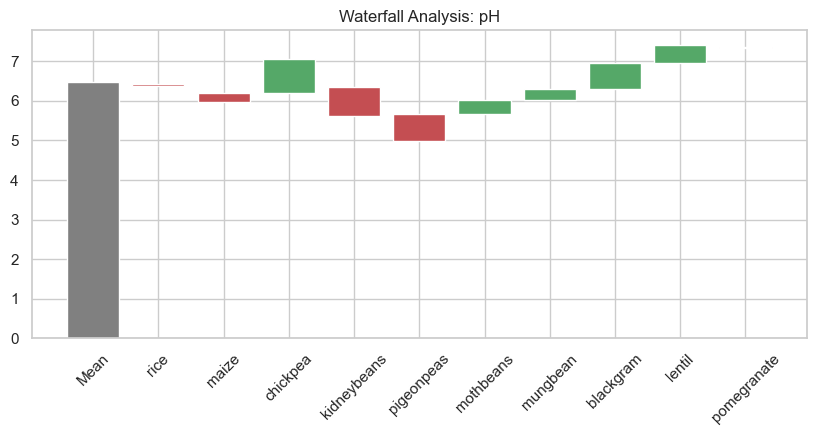

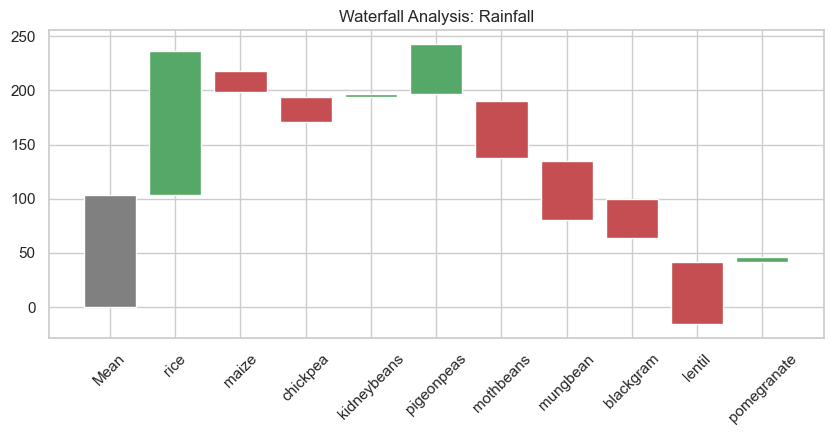

In [57]:
# Waterfall Chart
features = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
crops = data_1['Crop'].unique()[:10]
for f in features:
    avg = data_1[f].mean()
    c_means = data_1[data_1['Crop'].isin(crops)].groupby('Crop')[f].mean().reindex(crops)
    vals = np.insert((c_means - avg).values, 0, avg)
    cum = np.cumsum(vals)
    btm = np.where(vals > 0, np.roll(cum, 1), cum)
    btm[0] = 0
    
    plt.figure(figsize=(10, 4))
    plt.bar(['Mean'] + list(crops), vals, bottom=btm, color=['gray'] + ['g' if x > 0 else 'r' for x in vals[1:]])
    plt.title(f'Waterfall Analysis: {f}')
    plt.xticks(rotation=45)
    plt.show()

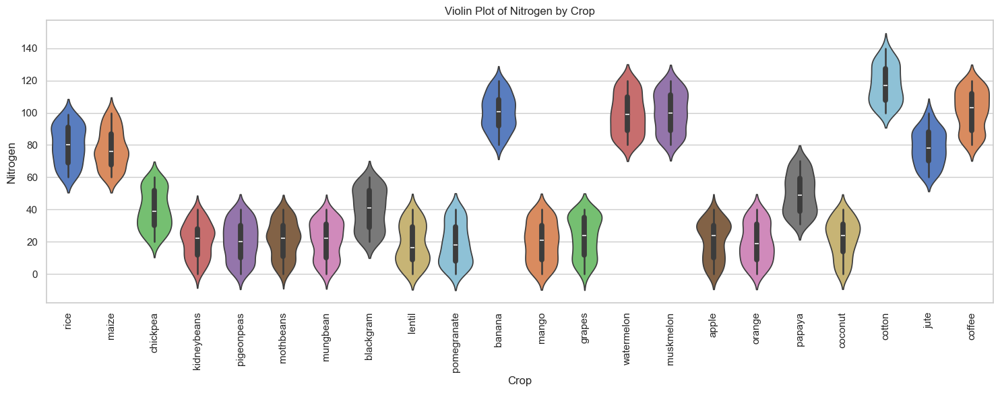

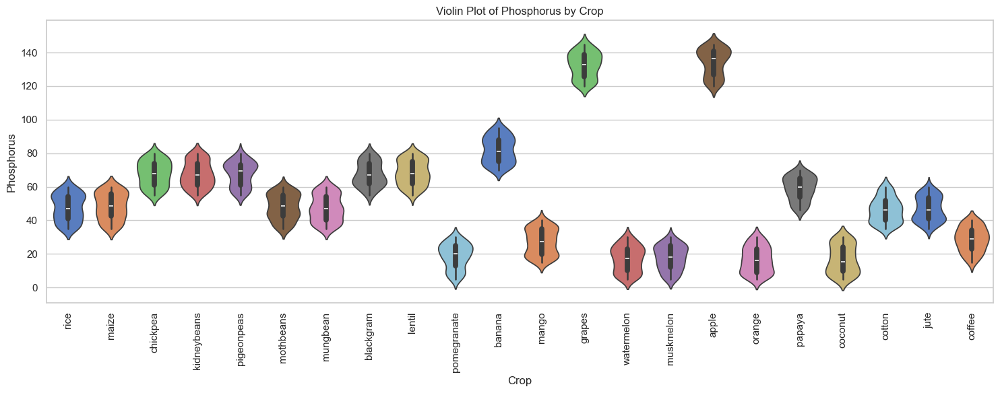

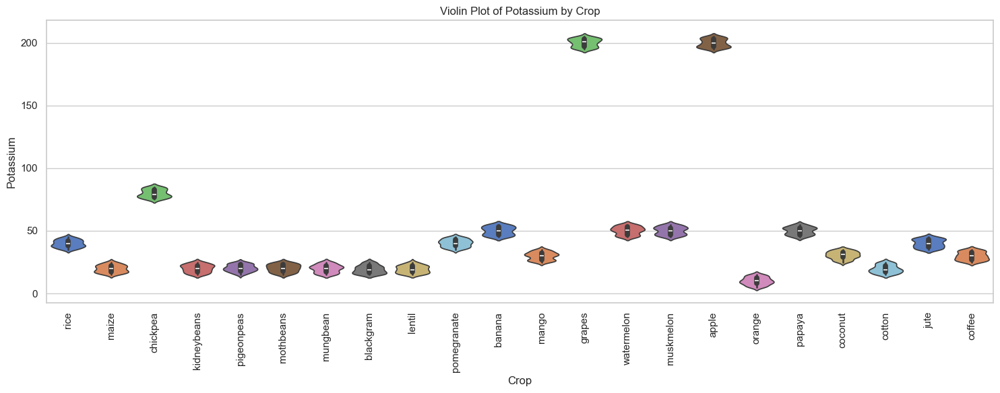

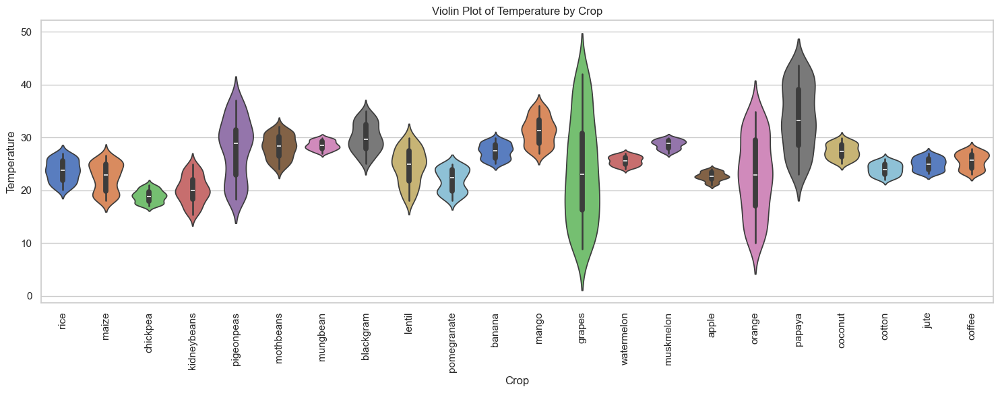

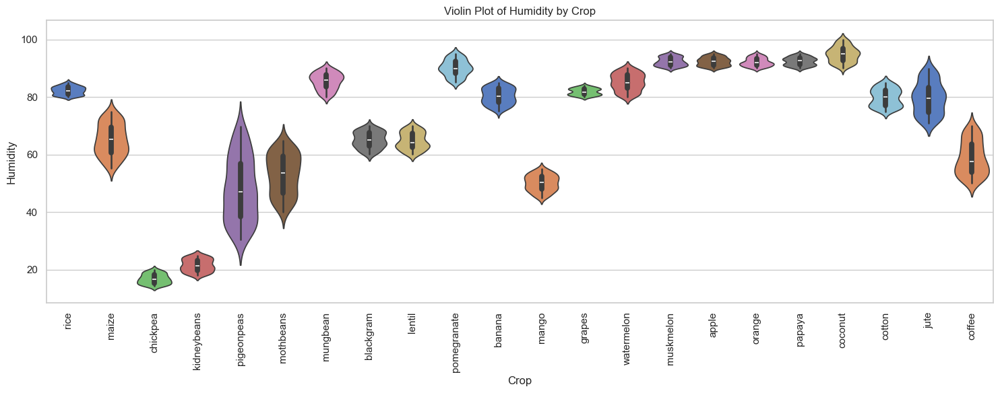

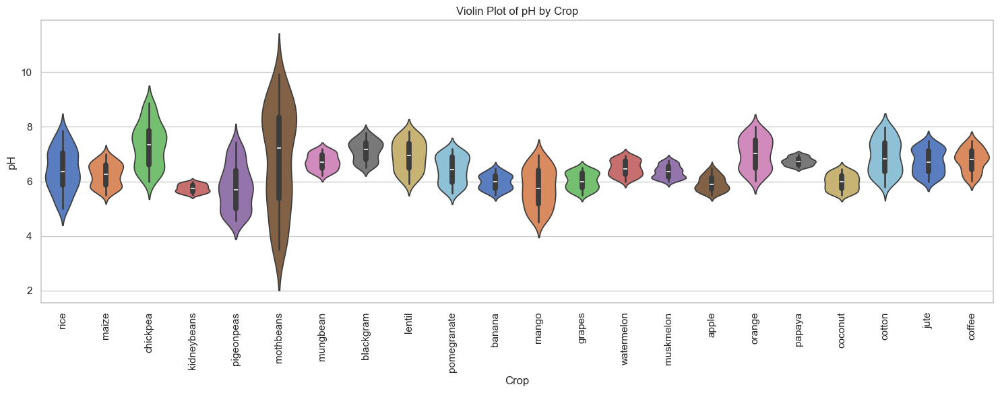

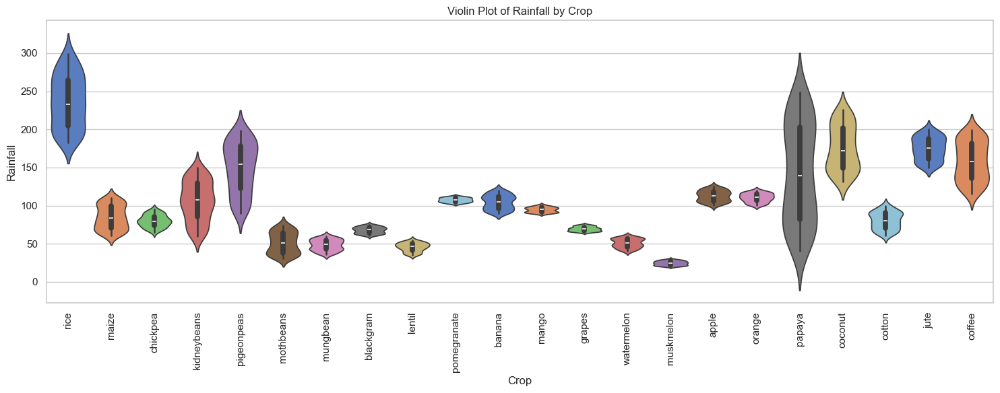

In [58]:
# Violin Plot
features = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
for feature in features:
    plt.figure(figsize=(15, 6))
    sns.violinplot(x='Crop', y=feature, data=data_1, palette="muted")
    plt.xticks(rotation=90)
    plt.title(f'Violin Plot of {feature} by Crop')
    plt.tight_layout()
    plt.show()

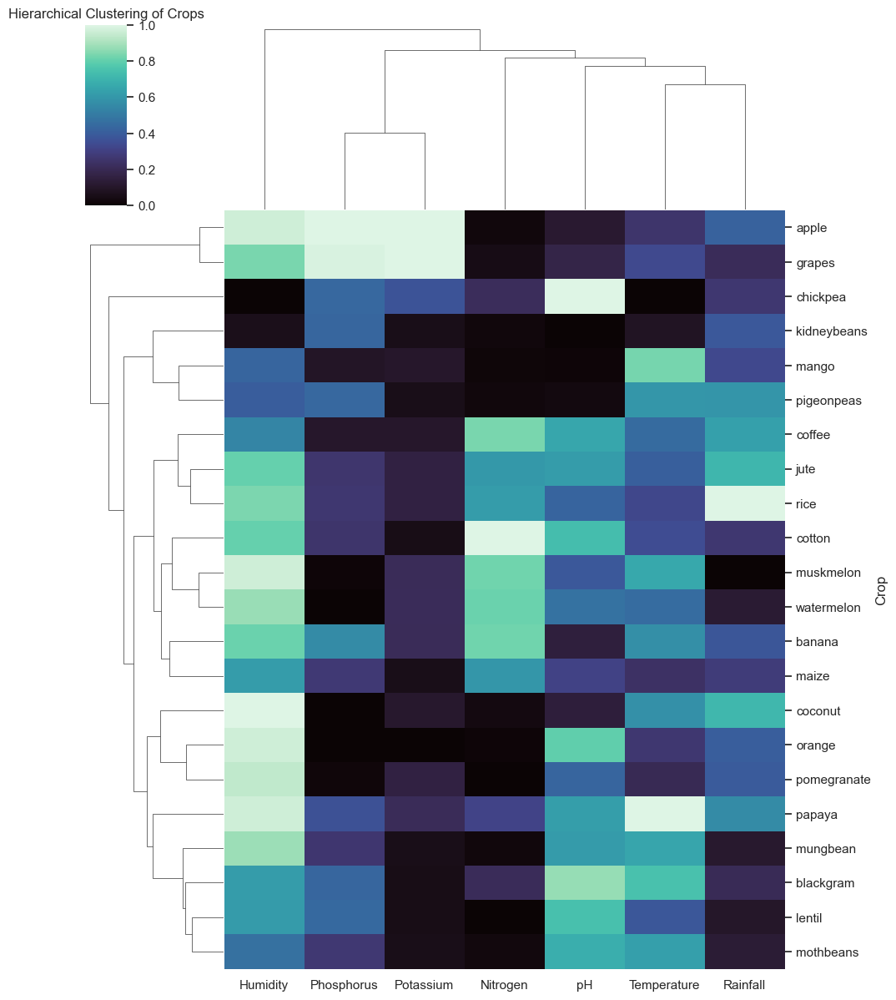

In [59]:
# Cluster Map (Hierarchical Clustering Heatmap)
features = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
label_col = 'Crop'
crops = data_1[label_col].unique()
crop_means = data_1.groupby(label_col).mean()
sns.clustermap(crop_means, standard_scale=1, cmap='mako', figsize=(10, 12))
plt.title('Hierarchical Clustering of Crops')
plt.show()

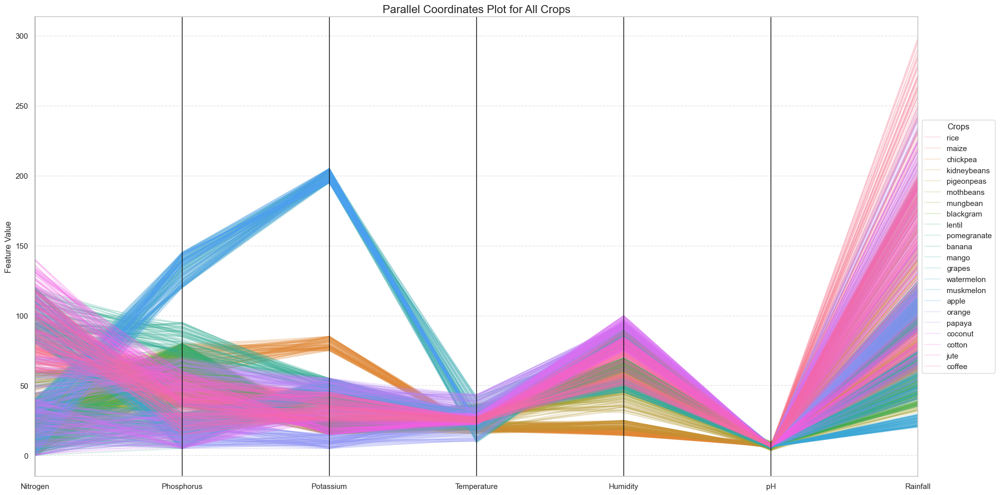

In [60]:
# Parallel Coordinates Plot
plot_df = data_1[features + [label_col]]
all_crops = data_1[label_col].unique()
plt.figure(figsize=(20, 10))
parallel_coordinates(plot_df, label_col, 
                     color=sns.color_palette("husl", len(all_crops)), 
                     alpha=0.2)
plt.title('Parallel Coordinates Plot for All Crops', fontsize=16)
plt.ylabel('Feature Value')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title="Crops", ncol=1)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

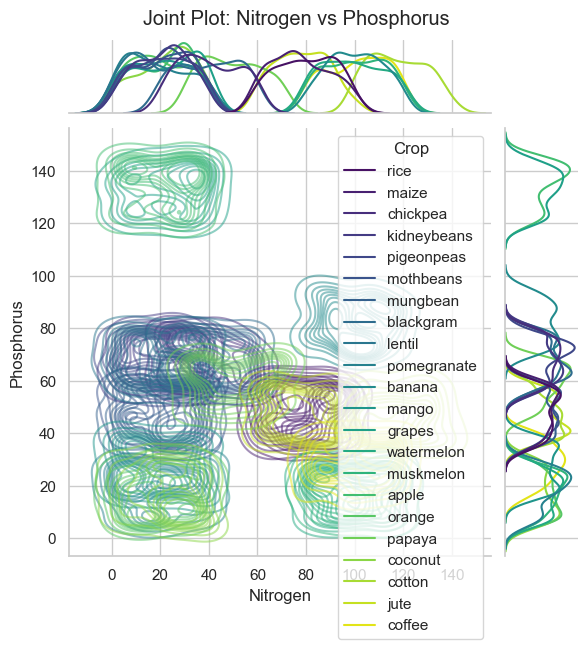

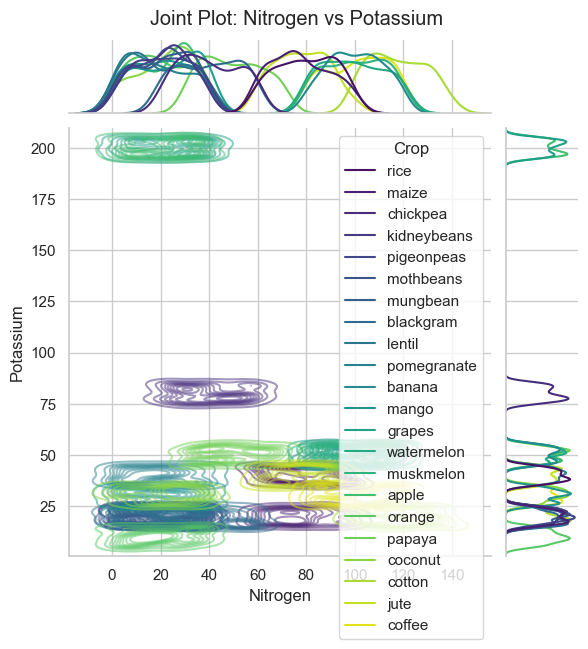

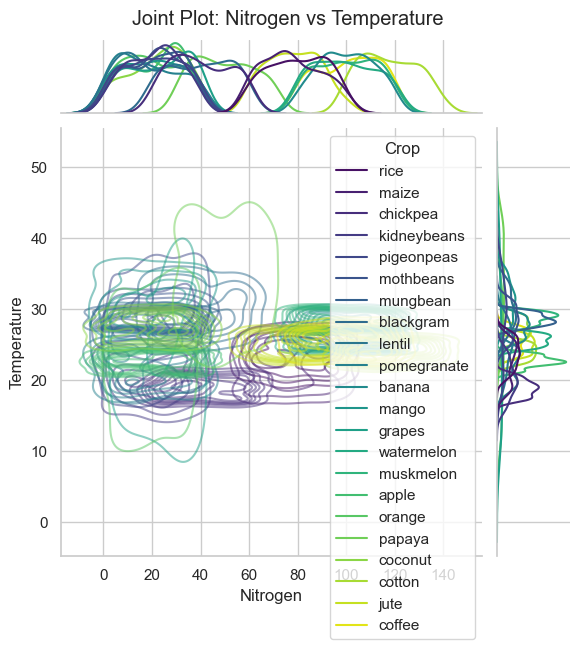

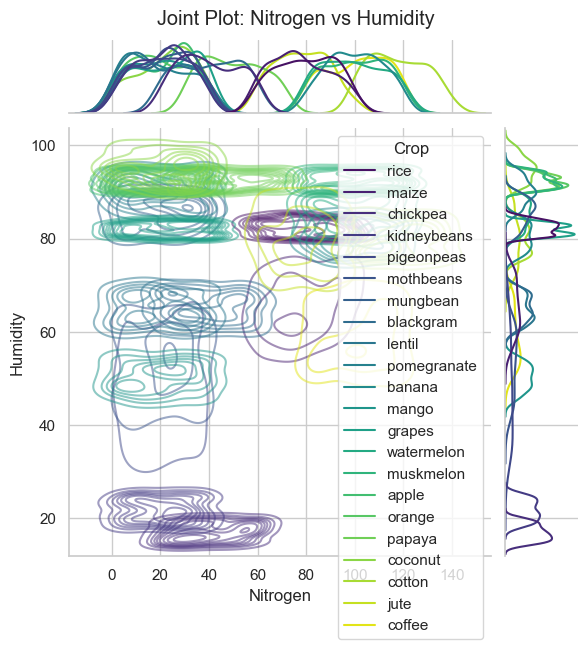

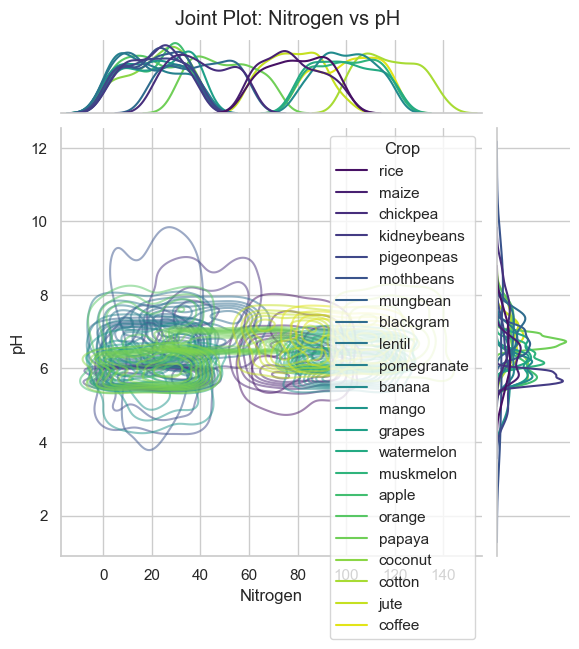

...

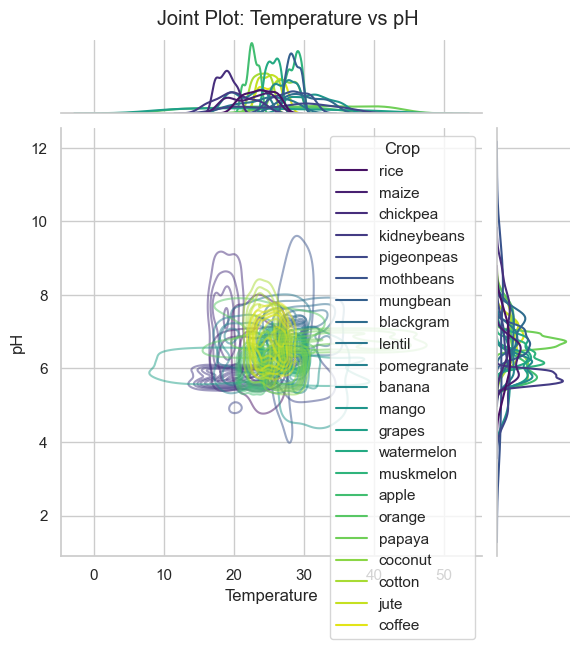

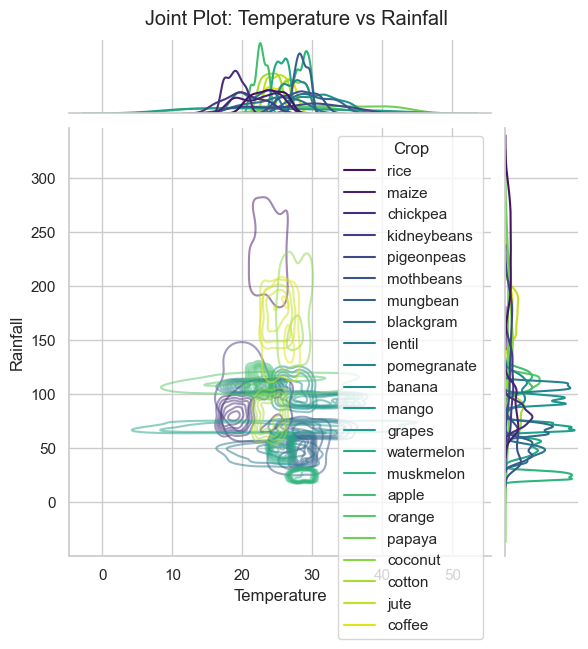

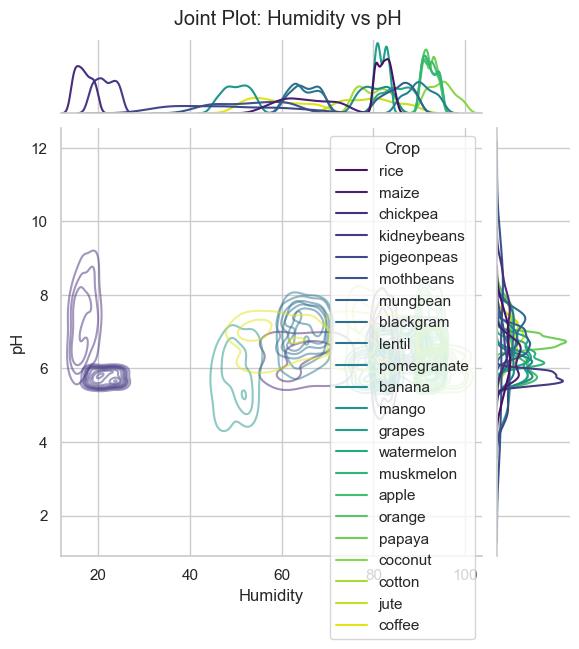

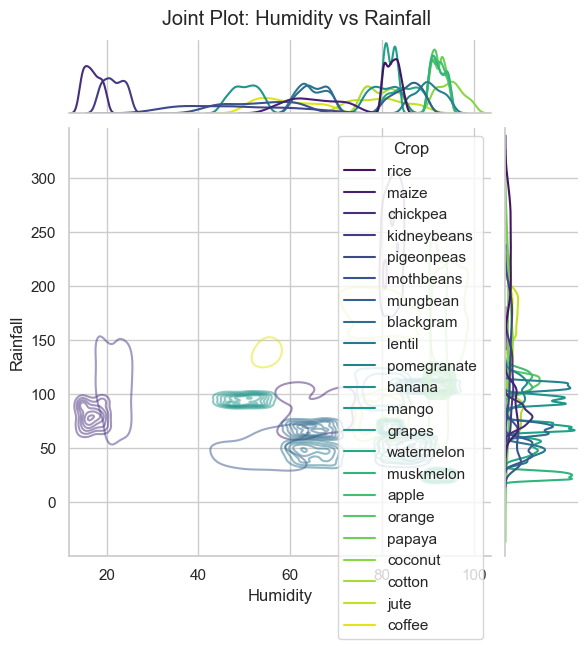

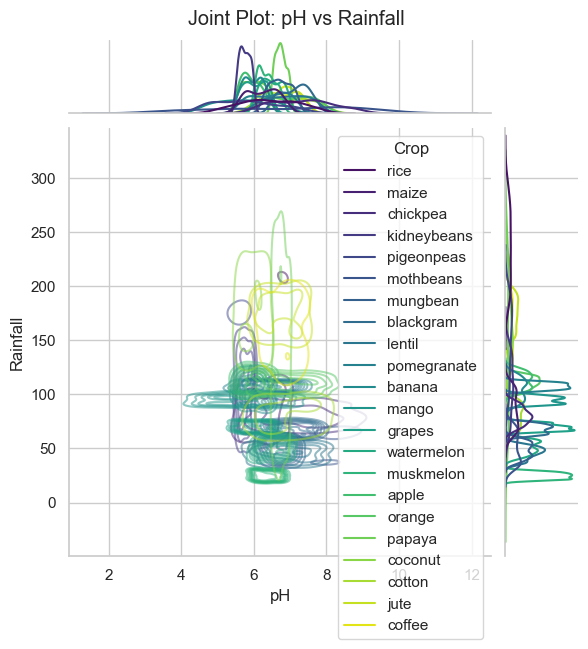

In [61]:
# Joint Plot
label_col = 'Crop'
features = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
feature_pairs = list(combinations(features, 2))
for x_feat, y_feat in feature_pairs:
    g = sns.jointplot(data=data_1, x=x_feat, y=y_feat, hue=label_col, 
                      palette='viridis', kind='kde', alpha=0.5)
    g.fig.suptitle(f'Joint Plot: {x_feat} vs {y_feat}', y=1.02)
    plt.show()

In [64]:
# PCA (Explained Variance)
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)
pca = PCA().fit(data_scaled)
cum_variance = np.cumsum(pca.explained_variance_ratio_)
print(f"Cumulative Variance Ratio:\n{cum_variance}")
print(f"Individual Variance Ratio:\n{pca.explained_variance_ratio_}")

Cumulative Variance Ratio:
[0.27588658 0.46073439 0.61452937 0.76066928 0.87578122 0.97243127
 1.        ]
Individual Variance Ratio:
[0.27588658 0.1848478  0.15379498 0.1461399  0.11511194 0.09665005
 0.02756873]


In [65]:
# Target Profiling
profile = data_1.groupby('Crop').agg(['mean', 'std'])
profile

Nitrogen            Phosphorus           Potassium            \
                mean        std       mean       std      mean       std   
Crop                                                                       
apple          20.80  11.863704     134.22  8.139665    199.89  3.320871   
banana        100.23  11.107241      82.01  7.690339     50.05  3.382591   
blackgram      40.02  12.664258      67.47  7.151259     19.24  3.188109   
chickpea       40.09  12.150649      67.79  7.498545     79.92  3.261901   
coconut        21.98  11.761931      16.93  8.357244     30.59  2.998636   
coffee        101.20  12.345203      28.74  7.276113     29.94  3.246817   
cotton        117.77  11.628817      46.24  7.348634     19.56  3.169680   
grapes         23.18  12.466829     132.53  7.619029    200.11  3.265662   
jute           78.40  10.968274      46.86  7.195706     39.99  3.313563   
kidneybeans    20.75  10.834266      67.54  7.571104     20.05  3.102215   
lentil         18.77  12.196915      68.36  7.335427     19.41  2.968164   
maize          77.76  11.949490      48.44  8.010498     19.79  2.941500   
mango          20.07  12.329037      27.18  7.663873     29.92  3.096691   
mothbeans      21.44  11.343418      48.01  7.547151     20.23  3.047950   
mungbean       20.99  11.510641      47.28  7.870261     19.87  3.148368   
muskmelon     100.32  12.176215      17.72  7.187363     50.08  3.218256   
orange         19.58  11.941930      16.55  7.691495     10.01  3.056687   
papaya         49.88  12.219607      59.05  7.057305     50.04  3.097474   
pigeonpeas     20.73  11.849950      67.73  7.294463     20.29  2.815165   
pomegranate    18.87  12.617652      18.75  7.387370     40.21  3.032800   
rice           79.89  11.917981      47.58  7.904966     39.87  2.946167   
watermelon     99.42  12.565127      17.00  7.535773     50.22  3.264687   

            Temperature           Humidity                 pH            \
                   mean       std     mean        std    mean       std   
Crop                                                                      
apple           22.6304  0.827224  92.3337   1.458730  5.9296  0.269282   
banana          27.3770  1.428134  80.3583   2.805208  5.9846  0.270937   
blackgram       29.9735  2.686327  65.1186   2.798234  7.1335  0.372749   
chickpea        18.8727  1.169775  16.8604   1.711807  7.3373  0.801166   
coconut         27.4100  1.385654  94.8442   2.685978  5.9766  0.287456   
coffee          25.5401  1.502698  58.8699   5.838470  6.7901  0.417306   
cotton          23.9887  1.135267  79.8437   3.050946  6.9127  0.626942   
grapes          23.8499  9.738722  81.8752   1.176642  6.0259  0.298644   
jute            24.9582  1.185326  79.6398   5.507576  6.7327  0.446046   
kidneybeans     20.1151  2.599292  21.6056   2.167141  5.7496  0.145087   
lentil          24.5088  3.321003  64.8051   2.935471  6.9281  0.549210   
maize           22.3892  2.678923  65.0920   5.448532  6.2451  0.413171   
mango           31.2083  2.654274  50.1569   2.755774  5.7661  0.703185   
mothbeans       28.1948  2.209321  53.1602   6.994535  6.8308  1.862086   
mungbean        28.5260  0.841100  85.5000   2.851694  6.7237  0.286345   
muskmelon       28.6629  0.861202  92.3432   1.504778  6.3592  0.231738   
orange          22.7655  7.342497  92.1700   1.430423  7.0173  0.576222   
papaya          33.7236  6.262622  92.4036   1.420443  6.7410  0.147412   
pigeonpeas      27.7415  5.715631  48.0617  10.963520  5.7939  0.830350   
pomegranate     21.8376  2.206480  90.1261   2.825190  6.4292  0.491682   
rice            23.6897  2.031268  82.2727   1.418084  6.4251  0.768441   
watermelon      25.5915  0.850156  85.1604   2.956641  6.4957  0.281192   

             Rainfall             
                 mean        std  
Crop                              
apple        112.6549   7.103041  
banana       104.6270   9.398695  
blackgram     67.8845   4.184590  
chickpea      80.0591   7

<Axes: xlabel='Nitrogen', ylabel='Rainfall'>

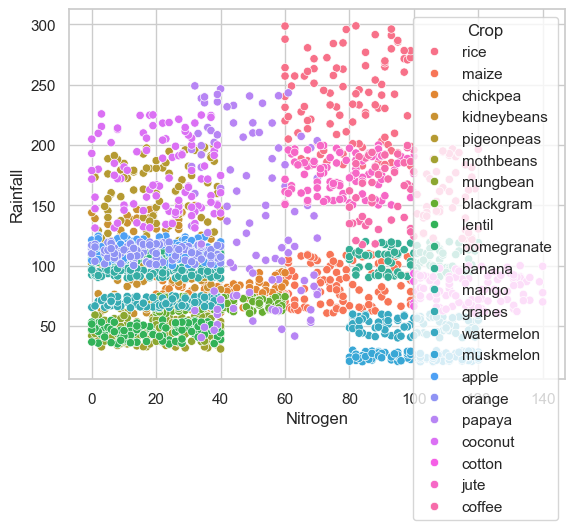

In [66]:
# 14. Bivariate Analysis
sns.scatterplot(data = data_1, x = 'Nitrogen', y='Rainfall', hue = 'Crop')

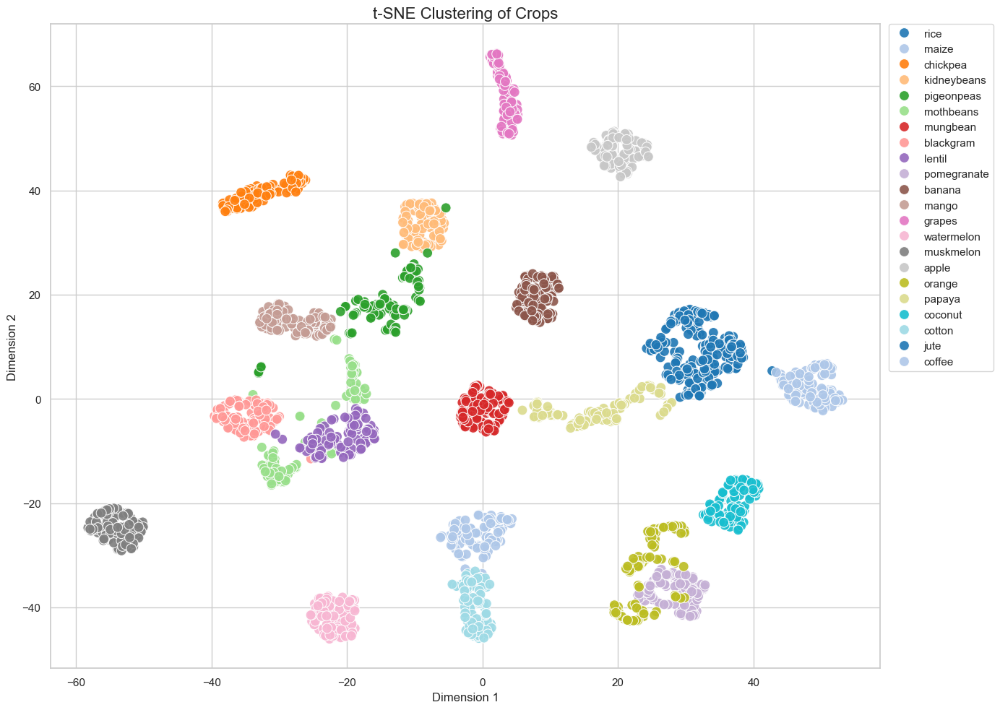

In [80]:
# t-SNE Visualization
from sklearn.manifold import TSNE
tsne_res = TSNE().fit_transform(StandardScaler().fit_transform(data))
tsne_df = pd.DataFrame(data = tsne_res, columns = ['Dimension 1', 'Dimension 2'])
tsne_df['Crop'] = data_1['Crop'].values  # Add the actual names back
plt.figure(figsize=(14, 10)) # Make it big enough to see details
sns.scatterplot(x = 'Dimension 1', y = 'Dimension 2', hue = 'Crop', palette = 'tab20', data = tsne_df, s = 100, alpha = 0.9)
plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left', borderaxespad=0.)
plt.title('t-SNE Clustering of Crops', fontsize=16)
plt.tight_layout()
plt.show()

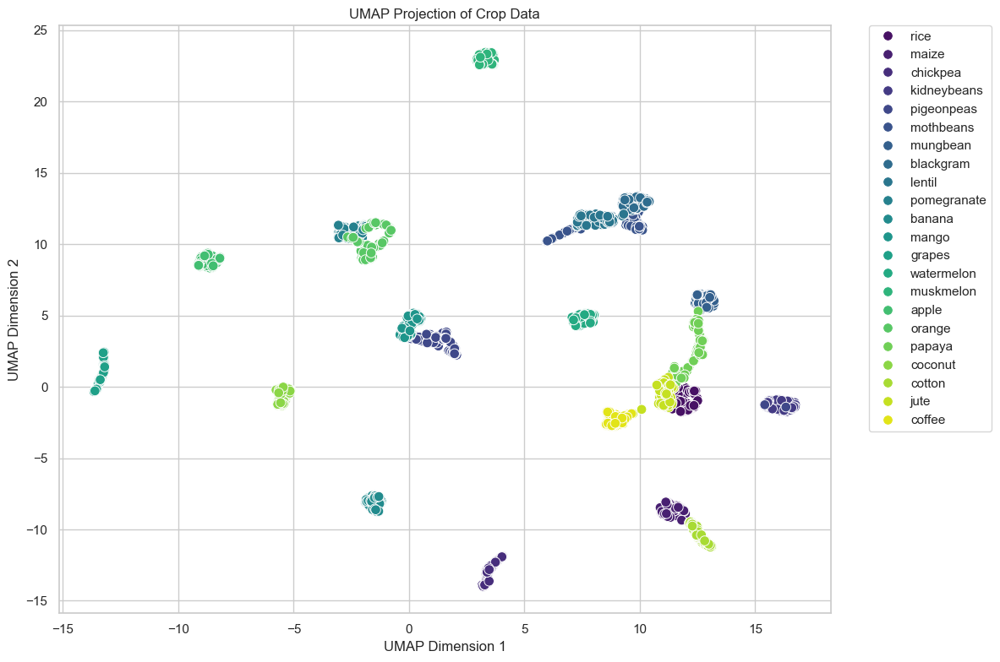

In [81]:
import umap
umap_reducer = umap.UMAP(n_neighbors = 15, min_dist = 0.1, random_state = 42)
umap_res = umap_reducer.fit_transform(StandardScaler().fit_transform(data))
umap_df = pd.DataFrame(data = umap_res, columns = ['UMAP_1', 'UMAP_2'])
umap_df['Crop'] = data_1['Crop'].values
plt.figure(figsize=(12, 8))
sns.scatterplot(x = 'UMAP_1', y = 'UMAP_2', hue = 'Crop', data = umap_df, palette = 'viridis', s = 70)
plt.title('UMAP Projection of Crop Data')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.) # Move legend outside
plt.tight_layout()
plt.show()

In [83]:
# Distance Matrix Calculation
from sklearn.metrics import pairwise_distances
crop_centers = data_1.groupby('Crop').mean()
dist_matrix = pairwise_distances(crop_centers)
dist_matrix

array([[5.39479661e-06, 1.78093866e+02, 2.00648484e+02, 1.61098284e+02,
        2.15459935e+02, 2.22855197e+02, 2.25525806e+02, 4.44088440e+01,
        2.01359895e+02, 2.04555227e+02, 2.05335426e+02, 2.11089256e+02,
        2.06210083e+02, 2.12258049e+02, 2.10181155e+02, 2.23859432e+02,
        2.23401235e+02, 1.73127990e+02, 2.00044129e+02, 1.97146592e+02,
        2.27960099e+02, 2.14967406e+02],
       [1.78093866e+02, 0.00000000e+00, 7.98513203e+01, 9.70616445e+01,
        1.26477207e+02, 8.10222218e+01, 5.58250464e+01, 1.79576660e+02,
        8.21181152e+01, 1.04559991e+02, 1.07175538e+02, 5.65680729e+01,
        1.04223206e+02, 1.08852150e+02, 1.07635297e+02, 1.03288454e+02,
        1.12199302e+02, 6.85003162e+01, 1.02287934e+02, 1.04176843e+02,
        1.37937243e+02, 8.45712359e+01],
       [2.00648484e+02, 7.98513203e+01, 0.00000000e+00, 7.92623098e+01,
        1.24584876e+02, 1.16400634e+02, 8.30972962e+01, 1.93785549e+02,
        1.18295550e+02, 6.17343658e+01, 3.12316092e+01

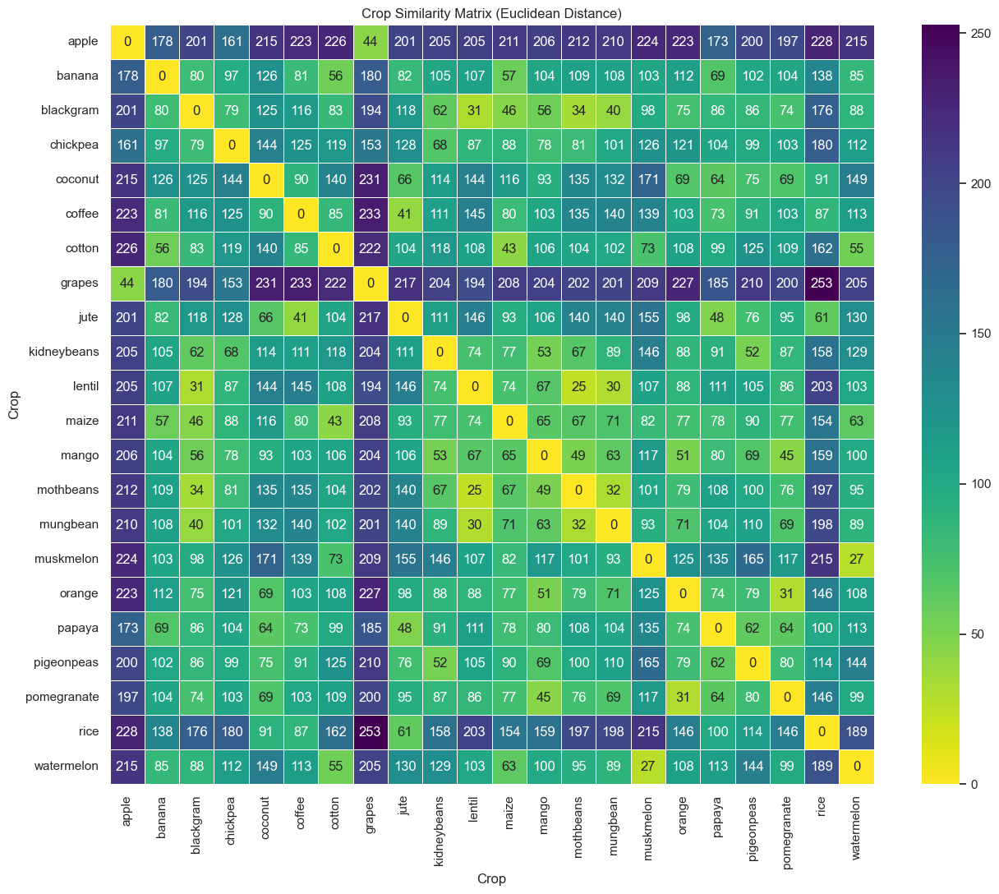

In [84]:
dist_df = pd.DataFrame(dist_matrix, index = crop_centers.index, columns = crop_centers.index)
plt.figure(figsize=(15, 12))
sns.heatmap(dist_df, annot = True, fmt = ".0f", cmap = "viridis_r", linewidths = 0.5)
plt.title("Crop Similarity Matrix (Euclidean Distance)")
plt.show()

In [87]:
# 18. pH Level Categorization
data_1['pH_Type'] = pd.cut(data_1['pH'], bins=[0, 5.5, 7.5, 14], labels=['Acidic', 'Neutral', 'Alkaline'])
data_1

,Nitrogen,Phosphorus,Potassium,Temperature,Humidity,pH,Rainfall,Crop,pH_Type
0,90.0,42.0,43.0,20.88,82.00,6.50,202.94,rice,Neutral
1,85.0,58.0,41.0,21.77,80.32,7.04,226.66,rice,Neutral
2,60.0,55.0,44.0,23.00,82.32,7.84,263.96,rice,Alkaline
3,74.0,35.0,40.0,26.49,80.16,6.98,242.86,rice,Neutral
4,78.0,42.0,42.0,20.13,81.60,7.63,262.72,rice,Alkaline
...,...,...,...,...,...,...,...,...,...
2195,107.0,34.0,32.0,26.77,66.41,6.78,177.77,coffee,Neutral
2196,99.0,15.0,27.0,27.42,56.64,6.09,127.92,coffee,Neutral
2197,118.0,33.0,30.0,24.13,67.23,6.36,173.32,coffee,Neutral
2198,117.0,32.0,34.0,26.27,52.13,6.76,127.18,coffee,Neutral


In [90]:
# Interaction Effects Analysis 
## Checks if the product of two variables (e.g., Nitrogen * Phosphorus) is a better predictor.
data['N_P_Interaction'] = data['Nitrogen'] * data['Phosphorus']
data

,Nitrogen,Phosphorus,Potassium,Temperature,Humidity,pH,Rainfall,pH_Type,N_P_Interaction
0,90.0,42.0,43.0,20.88,82.00,6.50,202.94,Neutral,3780.0
1,85.0,58.0,41.0,21.77,80.32,7.04,226.66,Neutral,4930.0
2,60.0,55.0,44.0,23.00,82.32,7.84,263.96,Alkaline,3300.0
3,74.0,35.0,40.0,26.49,80.16,6.98,242.86,Neutral,2590.0
4,78.0,42.0,42.0,20.13,81.60,7.63,262.72,Alkaline,3276.0
...,...,...,...,...,...,...,...,...,...
2195,107.0,34.0,32.0,26.77,66.41,6.78,177.77,Neutral,3638.0
2196,99.0,15.0,27.0,27.42,56.64,6.09,127.92,Neutral,1485.0
2197,118.0,33.0,30.0,24.13,67.23,6.36,173.32,Neutral,3894.0
2198,117.0,32.0,34.0,26.27,52.13,6.76,127.18,Neutral,3744.0


In [98]:
X = data_1.drop('Crop', axis=1)
y = data_1['Crop']

In [99]:
le = LabelEncoder()
y_encoded = le.fit_transform(y)

In [100]:
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

In [101]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [102]:
models = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(n_estimators=100),
    'SVM': SVC(kernel='linear'),
    'KNN': KNeighborsClassifier(),
    'Naive Bayes': GaussianNB()
}

In [103]:
results = []
for name, model in models.items():
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    acc = accuracy_score(y_test, y_pred)
    results.append({'Model': name, 'Accuracy': acc})

In [104]:
results_df = pd.DataFrame(results).sort_values(by='Accuracy', ascending=False)
print(results_df)

                 Model  Accuracy
5          Naive Bayes  0.995455
2        Random Forest  0.993182
1        Decision Tree  0.984091
3                  SVM  0.977273
0  Logistic Regression  0.963636
4                  KNN  0.956818


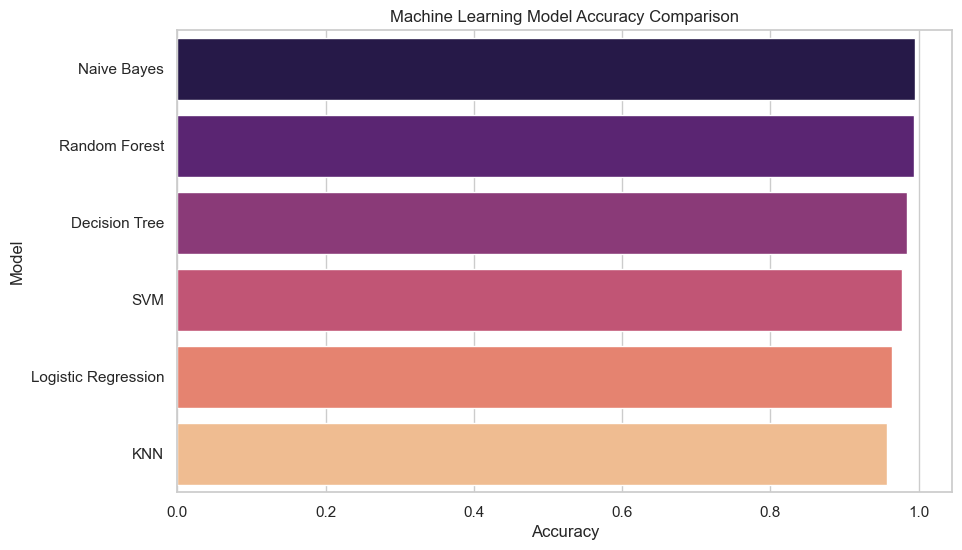

In [105]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Accuracy', y='Model', data=results_df, palette='magma')
plt.title('Machine Learning Model Accuracy Comparison')
plt.show()

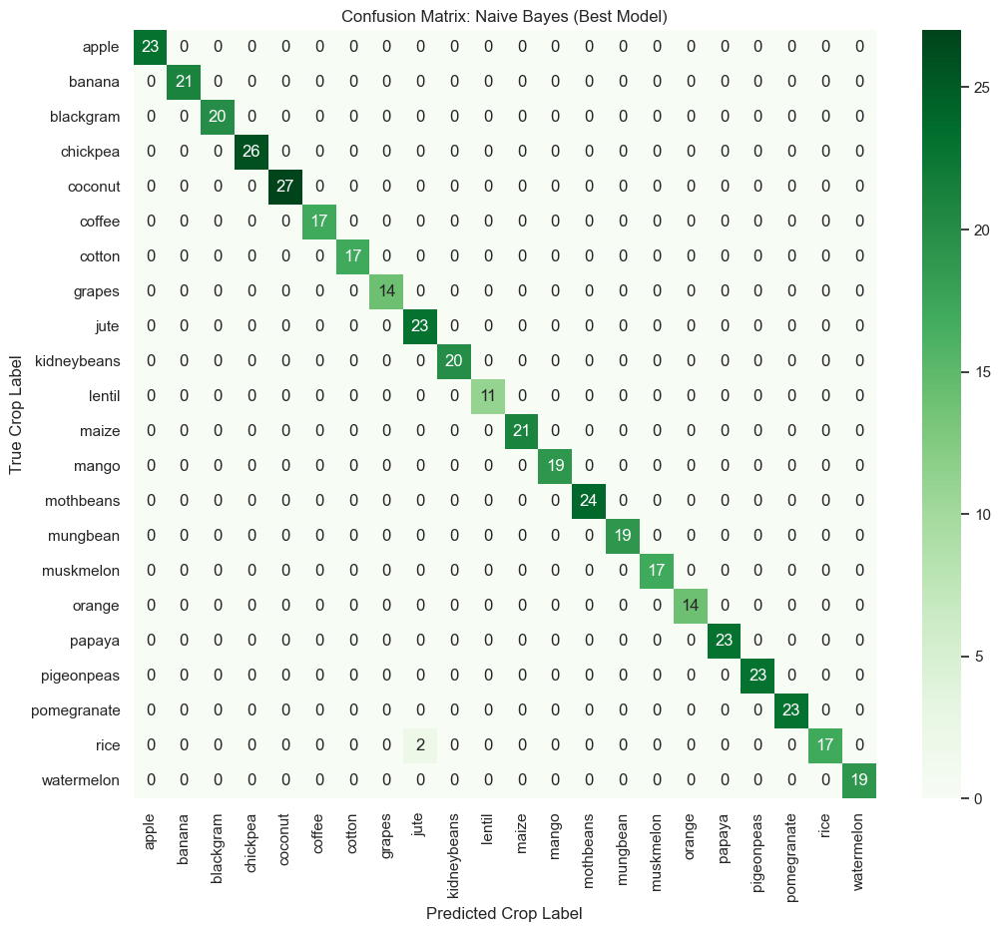

In [106]:
best_model = GaussianNB().fit(X_train_scaled, y_train)
y_pred_best = best_model.predict(X_test_scaled)
plt.figure(figsize=(12, 10))
cm = confusion_matrix(y_test, y_pred_best)
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix: Naive Bayes (Best Model)')
plt.ylabel('True Crop Label')
plt.xlabel('Predicted Crop Label')
plt.show()

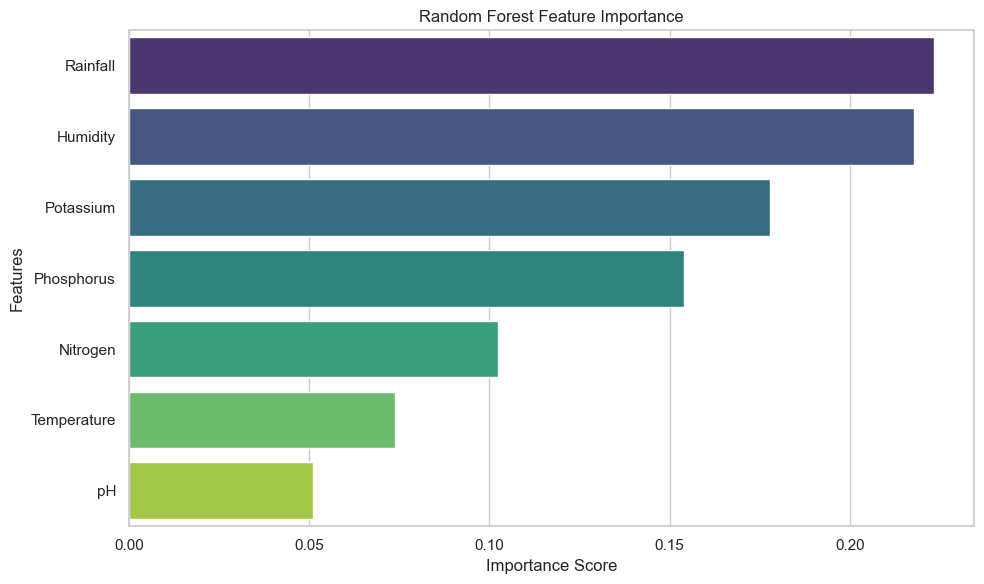

In [112]:
# Feature Importance Ranking
X = data
y = data_1['Crop']
rf = RandomForestClassifier(random_state=42, n_estimators=100)
rf.fit(X, y)
importances = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(x=importances.values, y=importances.index, palette='viridis')
plt.title("Random Forest Feature Importance")
plt.xlabel("Importance Score")
plt.ylabel("Features")
plt.tight_layout()
plt.show()

Running 5-Fold Cross Validation...
----------------------------------------
Logistic Regression : 0.9714 (+/- 0.0099)
Decision Tree       : 0.9877 (+/- 0.0045)
Random Forest       : 0.9936 (+/- 0.0033)
SVM                 : 0.9827 (+/- 0.0018)
KNN                 : 0.9705 (+/- 0.0066)
Naive Bayes         : 0.9950 (+/- 0.0022)


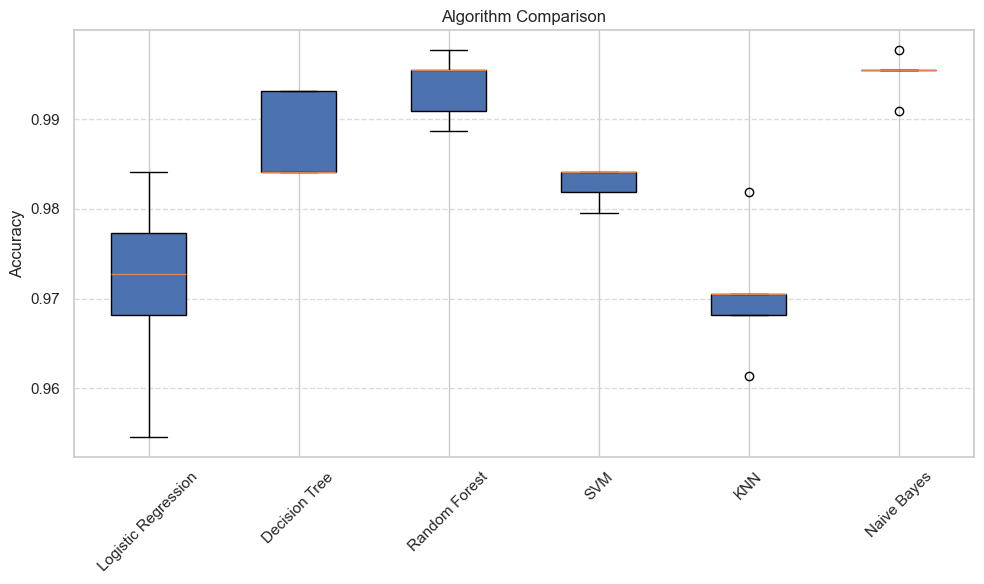

In [119]:
# Cross-Validation for ALL Models
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(random_state=42),
    "SVM": SVC(),
    "KNN": KNeighborsClassifier(),
    "Naive Bayes": GaussianNB()}
results = []
names = []
print("Running 5-Fold Cross Validation...")
print("-" * 40)

for name, model in models.items():
    pipeline = Pipeline([
        ('scaler', StandardScaler()), 
        ('classifier', model)])
    cv_scores = cross_val_score(pipeline, X, y, cv=5, scoring='accuracy')
    results.append(cv_scores)
    names.append(name)  
    print(f"{name:<20}: {cv_scores.mean():.4f} (+/- {cv_scores.std():.4f})")
plt.figure(figsize=(10, 6))
plt.boxplot(results, labels=names, patch_artist=True)
plt.title('Algorithm Comparison')
plt.ylabel('Accuracy')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [6]:
# K-Means
from sklearn.cluster import KMeans
X = data_1.drop(['Crop'], axis=1, errors='ignore')
km = KMeans(n_clusters=4, init='k-means++', random_state=42)
data_1['Cluster'] = km.fit_predict(X)
print("--- Crops grouped by Cluster ---")
for cluster_num in sorted(data_1['Cluster'].unique()):
    crops = data_1[data_1['Cluster'] == cluster_num]['Crop'].unique()
    print(f"\nCluster {cluster_num}:")
    print(", ".join(crops))

--- Crops grouped by Cluster ---

Cluster 0:
maize, chickpea, kidneybeans, pigeonpeas, mothbeans, mungbean, blackgram, lentil, pomegranate, mango, orange, papaya, coconut

Cluster 1:
maize, banana, watermelon, muskmelon, papaya, cotton, coffee

Cluster 2:
rice, pigeonpeas, papaya, coconut, jute, coffee

Cluster 3:
grapes, apple


In [18]:
# Random Forest Model
data_1 = pd.read_csv("Agri Project Data With Outlier.csv")
X = data_1.drop('Crop', axis=1)
y = data_1['Crop']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

def recommend_crops():
    print("--- ENTER CLIMATE & SOIL DETAILS ---")
    user_input = []
    feature_names = X.columns.tolist()   
    for feature in feature_names:
        val = float(input(f"Enter value for {feature}: "))
        user_input.append(val)
    current_crop = input("What crop are you currently cultivating? (Enter 'None' if nothing): ").strip()
    features = np.array([user_input])
    prediction = model.predict(features)[0]
    print(f"\n>>> BEST CROP TO CULTIVATE: {prediction}")
    probs = model.predict_proba(features)[0]
    classes = model.classes_
    prob_df = pd.DataFrame({'Crop': classes, 'Probability': probs})
    prob_df = prob_df.sort_values(by='Probability', ascending=False)
    alternatives = prob_df[
        (prob_df['Probability'] > 0.05) & 
        (prob_df['Crop'] != current_crop) &
        (prob_df['Crop'] != prediction)]
    print(f"\n>>> ALTERNATIVE OPTIONS (based on same climate):")
    if not alternatives.empty:
        for idx, row in alternatives.iterrows():
            print(f"- {row['Crop']} (Confidence: {row['Probability']:.1%})")
    else:
        print("No other crops strongly recommended for these specific conditions.")
recommend_crops()

--- ENTER CLIMATE & SOIL DETAILS ---


Enter value for Nitrogen:  90
Enter value for Phosphorus:  33
Enter value for Potassium:  38
Enter value for Temperature:  21
Enter value for Humidity:  80
Enter value for pH:  7.8
Enter value for Rainfall:  233.11
What crop are you currently cultivating? (Enter 'None' if nothing):  rice



>>> BEST CROP TO CULTIVATE: rice

>>> ALTERNATIVE OPTIONS (based on same climate):
- jute (Confidence: 18.0%)
- coffee (Confidence: 9.0%)


In [19]:
# Naive Bayes & K-Means Model
data_1 = pd.read_csv("Agri Project Data With Outlier.csv")
X = data_1.drop('Crop', axis=1)
y = data_1['Crop']
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
kmeans = KMeans(n_clusters=4, init='k-means++', random_state=42)
data_1['Cluster'] = kmeans.fit_predict(X_scaled)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
nb_model = GaussianNB()
nb_model.fit(X_train, y_train)
accuracy = accuracy_score(y_test, nb_model.predict(X_test))

def recommend_crops_advanced():
    print("--- ENTER CLIMATE & SOIL DETAILS ---")
    user_vals = []
    feature_names = X.columns.tolist()    
    for feature in feature_names:
        try:
            val = float(input(f"Enter value for {feature}: "))
            user_vals.append(val)
        except ValueError:
            print(f"Invalid input. Please enter numbers.")
            return
    user_input_array = np.array([user_vals])
    user_input_scaled = scaler.transform(user_input_array)
    best_prediction = nb_model.predict(user_input_array)[0]
    probs = nb_model.predict_proba(user_input_array)[0]
    classes = nb_model.classes_
    user_cluster = kmeans.predict(user_input_scaled)[0]
    similar_crops = data_1[data_1['Cluster'] == user_cluster]['Crop'].unique()
    print(f">>> PRIMARY RECOMMENDATION (Naive Bayes): {best_prediction.upper()}")
    print(f"\n>>> STATISTICAL ALTERNATIVES (High Probability):")
    prob_df = pd.DataFrame({'Crop': classes, 'Prob': probs}).sort_values(by='Prob', ascending=False)
    alts = prob_df[prob_df['Crop'] != best_prediction].head(3)
    for _, row in alts.iterrows():
        if row['Prob'] > 0.01:
            print(f"- {row['Crop']} ({row['Prob']:.1%} confidence)")
    print(f"\n>>> CLIMATOLOGICALLY SIMILAR CROPS (K-Means Cluster {user_cluster}):")
    cluster_alts = [c for c in similar_crops if c != best_prediction]
    if cluster_alts:
        print(", ".join(cluster_alts[:6])) # Show first 6 similar crops
    else:
        print("No other crops found in this specific climate cluster.")
if __name__ == "__main__":
    recommend_crops_advanced()

--- ENTER CLIMATE & SOIL DETAILS ---


Enter value for Nitrogen:  90
Enter value for Phosphorus:  33
Enter value for Potassium:  38
Enter value for Temperature:  21
Enter value for Humidity:  80
Enter value for pH:  7.8
Enter value for Rainfall:  233.11


>>> PRIMARY RECOMMENDATION (Naive Bayes): RICE

>>> STATISTICAL ALTERNATIVES (High Probability):

>>> CLIMATOLOGICALLY SIMILAR CROPS (K-Means Cluster 1):
pigeonpeas, pomegranate, orange, papaya, coconut, jute


In [21]:
data_1 = pd.read_csv("Agri Project Data With Outlier.csv")
X = data_1.drop('Crop', axis=1)
y = data_1['Crop']
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
kmeans = KMeans(n_clusters=4, init='k-means++', random_state=42)
data_1['Cluster'] = kmeans.fit_predict(X_scaled)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
nb_model = GaussianNB()
nb_model.fit(X_train, y_train)
accuracy = accuracy_score(y_test, nb_model.predict(X_test))

def get_crop_requirements():
    print("--- CROP REQUIREMENTS GUIDE ---")
    target_crop = input("Enter the crop name (e.g., Rice, Maize): ").strip()
    crop_data = data_1[data_1['Crop'].str.lower() == target_crop.lower()]
    if crop_data.empty:
        print(f"No data found for '{target_crop}'.")
        return
    print(f"\nIdeal conditions for {target_crop.capitalize()}:")
    print("-" * 65)
    print(f"{'Feature':<15} | {'Min':<10} | {'Max':<10} | {'Avg (Ideal)':<15}")
    print("-" * 65)
    for feature in X.columns:
        print(f"{feature:<15} | {crop_data[feature].min():<10.2f} | "
              f"{crop_data[feature].max():<10.2f} | {crop_data[feature].mean():<15.2f}")

def recommend_crop():
    print("\n--- CROP RECOMMENDATION SYSTEM ---")
    user_vals = []
    feature_names = X.columns.tolist()
    for feature in feature_names:
        try:
            val = float(input(f"Enter value for {feature}: "))
            user_vals.append(val)
        except ValueError:
            print("Invalid input. Please enter numbers.")
            return
    user_input = np.array([user_vals])
    user_input_scaled = scaler.transform(user_input)
    prediction = nb_model.predict(user_input)[0]
    probs = nb_model.predict_proba(user_input)[0]
    classes = nb_model.classes_
    prob_list = sorted(zip(classes, probs), key=lambda x: x[1], reverse=True)
    user_cluster = kmeans.predict(user_input_scaled)[0]
    cluster_mates = data_1[data_1['Cluster'] == user_cluster]['Crop'].unique()
    print(f"\n" + "="*45)
    print(f"PRIMARY RECOMMENDATION: {prediction.upper()}")
    print("="*45)
    print("\nTOP STATISTICAL ALTERNATIVES:")
    for crop, prob in prob_list:
        if crop != prediction and prob > 0.01:
            print(f"- {crop}: {prob:.1%} confidence")
    print(f"\nCLIMATOLOGICALLY SIMILAR CROPS (Cluster {user_cluster}):")
    other_crops = [c for c in cluster_mates if c != prediction]
    if other_crops:
        print(", ".join(other_crops[:6])) # Show up to 6 similar crops
    else:
        print("No other crops match this specific environment.")
while True:
    print("\n==============================")
    print("   AI FARMER ASSISTANT V3.0   ")
    print("==============================")
    print("1. Recommend Crop (NB + KMeans)")
    print("2. Crop Requirements Guide")
    print("3. Exit")  
    choice = input("\nSelect an option (1/2/3): ")
    if choice == '1':
        recommend_crop()
    elif choice == '2':
        get_crop_requirements()
    elif choice == '3':
        print("Exiting tool. Good luck with your harvest!")
        break
    else:
        print("Invalid choice. Please try again.")


   AI FARMER ASSISTANT V3.0   
1. Recommend Crop (NB + KMeans)
2. Crop Requirements Guide
3. Exit



Select an option (1/2/3):  1



--- CROP RECOMMENDATION SYSTEM ---


Enter value for Nitrogen:  90
Enter value for Phosphorus:  33
Enter value for Potassium:  38
Enter value for Temperature:  21
Enter value for Humidity:  80
Enter value for pH:  7.8
Enter value for Rainfall:  233.11



PRIMARY RECOMMENDATION: RICE

TOP STATISTICAL ALTERNATIVES:

CLIMATOLOGICALLY SIMILAR CROPS (Cluster 1):
pigeonpeas, pomegranate, orange, papaya, coconut, jute

   AI FARMER ASSISTANT V3.0   
1. Recommend Crop (NB + KMeans)
2. Crop Requirements Guide
3. Exit



Select an option (1/2/3):  2


--- CROP REQUIREMENTS GUIDE ---


Enter the crop name (e.g., Rice, Maize):  Maize



Ideal conditions for Maize:
-----------------------------------------------------------------
Feature         | Min        | Max        | Avg (Ideal)    
-----------------------------------------------------------------
Nitrogen        | 60.00      | 100.00     | 77.76          
Phosphorus      | 35.00      | 60.00      | 48.44          
Potassium       | 15.00      | 25.00      | 19.79          
Temperature     | 18.04      | 26.55      | 22.39          
Humidity        | 55.28      | 74.83      | 65.09          
pH              | 5.51       | 7.00       | 6.25           
Rainfall        | 60.65      | 109.75     | 84.77          

   AI FARMER ASSISTANT V3.0   
1. Recommend Crop (NB + KMeans)
2. Crop Requirements Guide
3. Exit



Select an option (1/2/3):  2


--- CROP REQUIREMENTS GUIDE ---


Enter the crop name (e.g., Rice, Maize):  JUTE



Ideal conditions for Jute:
-----------------------------------------------------------------
Feature         | Min        | Max        | Avg (Ideal)    
-----------------------------------------------------------------
Nitrogen        | 60.00      | 100.00     | 78.40          
Phosphorus      | 35.00      | 60.00      | 46.86          
Potassium       | 35.00      | 45.00      | 39.99          
Temperature     | 23.09      | 26.99      | 24.96          
Humidity        | 70.88      | 89.89      | 79.64          
pH              | 6.00       | 7.49       | 6.73           
Rainfall        | 150.24     | 199.84     | 174.79         

   AI FARMER ASSISTANT V3.0   
1. Recommend Crop (NB + KMeans)
2. Crop Requirements Guide
3. Exit



Select an option (1/2/3):  2


--- CROP REQUIREMENTS GUIDE ---


Enter the crop name (e.g., Rice, Maize):  PAPAYA



Ideal conditions for Papaya:
-----------------------------------------------------------------
Feature         | Min        | Max        | Avg (Ideal)    
-----------------------------------------------------------------
Nitrogen        | 31.00      | 70.00      | 49.88          
Phosphorus      | 46.00      | 70.00      | 59.05          
Potassium       | 45.00      | 55.00      | 50.04          
Temperature     | 23.01      | 43.68      | 33.72          
Humidity        | 90.04      | 94.94      | 92.40          
pH              | 6.50       | 6.99       | 6.74           
Rainfall        | 40.35      | 248.86     | 142.63         

   AI FARMER ASSISTANT V3.0   
1. Recommend Crop (NB + KMeans)
2. Crop Requirements Guide
3. Exit



Select an option (1/2/3):  3


Exiting tool. Good luck with your harvest!


In [20]:
import difflib
try:
    data_1 = pd.read_csv("Agri Project Data With Outlier.csv")
    print("Dataset loaded successfully.")
except FileNotFoundError:
    print("Error: File not found. Please check the file name.")
    exit()
def calculate_water_need():
    print("\n--- IRRIGATION CALCULATOR ---")
    user_input = input("Which crop is currently in the field? (e.g., Rice): ").strip()
    all_crops = data_1['Crop'].unique().astype(str)
    matches = difflib.get_close_matches(user_input, all_crops, n=1, cutoff=0.5)
    if not matches:
        print(f"Error: Could not find '{user_input}' in the dataset.")
        return
    crop_name = matches[0]
    if crop_name.lower() != user_input.lower():
        print(f"Did you mean **{crop_name}**? (Proceeding with {crop_name} data...)")
    crop_stats = data_1[data_1['Crop'] == crop_name]
    try:
        current_rain = float(input(f"How much rainfall (in mm) has the field received so far? "))
        land_area = float(input("What is the land area in Square Meters? (Enter 0 if unknown): "))
    except ValueError:
        print("Invalid input. Please enter numbers only.")
        return
    optimal_rain = crop_stats['Rainfall'].mean()
    min_rain_needed = crop_stats['Rainfall'].min()
    print(f"\nAnalysis for **{crop_name}**:")
    print(f"- Optimal Rainfall Target:   {optimal_rain:.2f} mm")
    print(f"- Minimum Survival Limit:    {min_rain_needed:.2f} mm")
    print(f"- Current Rainfall:          {current_rain:.2f} mm")
    print("-" * 50)
    if current_rain < min_rain_needed:
        gap = min_rain_needed - current_rain
        print(">>> 🚨 CRITICAL WARNING: Rainfall is below minimum survival levels!")
        print(f"You MUST irrigate at least **{gap:.2f} mm** immediately just to save the crop.")
        
        if land_area > 0:
            print(f"   (That is {gap * land_area:,.0f} Liters of water immediately)")
    elif current_rain < optimal_rain:
        deficit = optimal_rain - current_rain
        print(f">>> STATUS: WATER SHORTAGE (Below Optimal)")
        print(f"To reach optimal growth, you need an additional **{deficit:.2f} mm** of water.")
        if land_area > 0:
            total_liters = deficit * land_area
            print(f"\n>>> IRRIGATION REQUIRED:")
            print(f"For your {land_area} sq.m field, pump: **{total_liters:,.0f} Liters**")
        else:
            print(f"(Tip: Multiply {deficit:.2f} by your land area in sq.m to get Liters)")
    else:
        print(">>> STATUS: ✅ SUFFICIENT WATER")
        print("Current rainfall is adequate for this crop. No irrigation needed.")
calculate_water_need()

Dataset loaded successfully.

--- IRRIGATION CALCULATOR ---


Which crop is currently in the field? (e.g., Rice):  Rice
How much rainfall (in mm) has the field received so far?  135
What is the land area in Square Meters? (Enter 0 if unknown):  80



Analysis for **rice**:
- Optimal Rainfall Target:   236.18 mm
- Minimum Survival Limit:    182.56 mm
- Current Rainfall:          135.00 mm
--------------------------------------------------
>>> 🚨 CRITICAL WARNING: Rainfall is below minimum survival levels!
You MUST irrigate at least **47.56 mm** immediately just to save the crop.
   (That is 3,805 Liters of water immediately)
